# Essential Libraries

In [1]:
# Following are the general libraries required for our project
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Installation (incase the running computer never install previously)
%pip install scikit-learn
%pip install -U imbalanced-learn
%pip install pydotplus
%pip install graphviz
%pip install tensorflow
%pip install -q -U keras-tuner


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note

# 1. Question and Dataset

Our project examines a dataset of White-Wine, that consist a list of white wines with various quality ratings, ranging from 3 to 9, along several parameters, such as density, ingradients, aclohol level, and others.

We aaim to explore the relationship between the given parameter of the wine and their associated quality ratings. Hence, we applied 4 different models to analyse the relationships and compared the results from each model to findout which is the most effective model for this datasets.

The four models applied in our project are: 
-
- Linear Regression
- k-Means clustering
- Decision tree / Random forest
- Neuron network

Dataset: https://archive.ics.uci.edu/dataset/186/wine+quality 

In [2]:
wine = pd.read_csv("winequality-white.csv", sep =";")
wine.head(None)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [3]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


# 2. Dataset Visualisation

## 2.1 Scatter plots
To visualise the distribution of each parameter over different quality ratings.

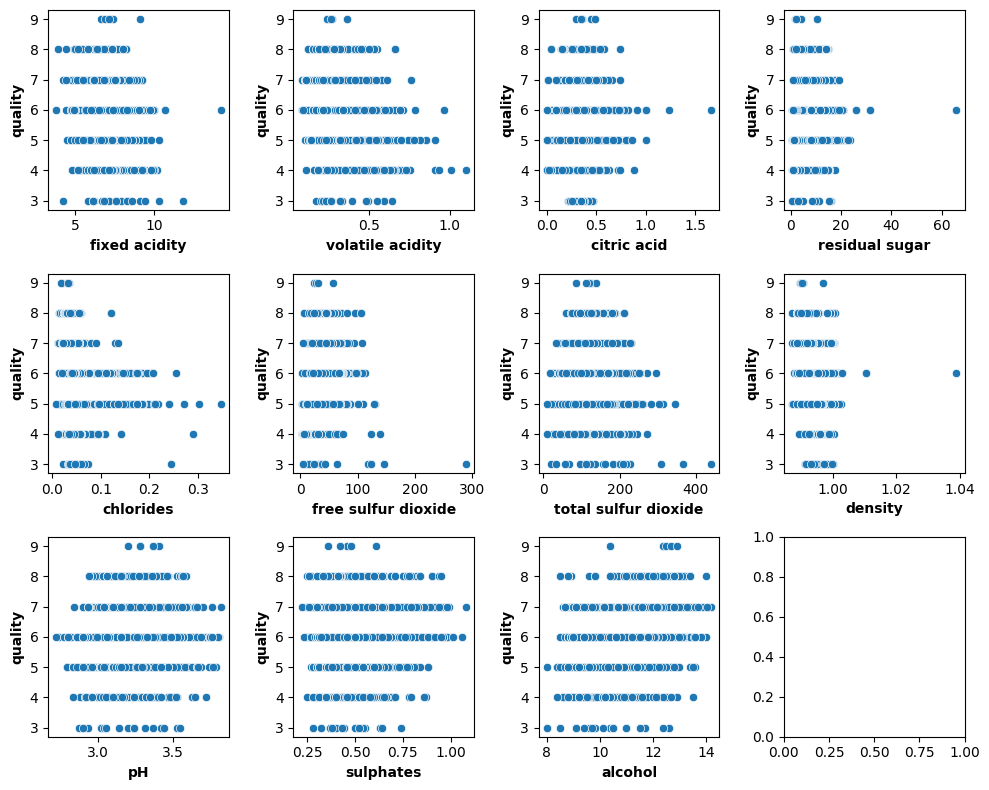

In [4]:
variables_to_plot = wine.columns.drop('quality')

fig, axes = plt.subplots(3, 4, figsize=(10, 8))

row = 0
col = 0

for indx, var in enumerate(variables_to_plot):
    row = indx // 4
    col = indx % 4
    sns.scatterplot(x=wine[var], y=wine['quality'], ax=axes[row,col])
    axes[row,col].set_xlabel(var,fontweight='bold')
    axes[row,col].set_ylabel('quality',fontweight='bold')
    
plt.tight_layout()
plt.show()

## 2.2 Histograms
To visualise the distribution of each parameters by frequency.

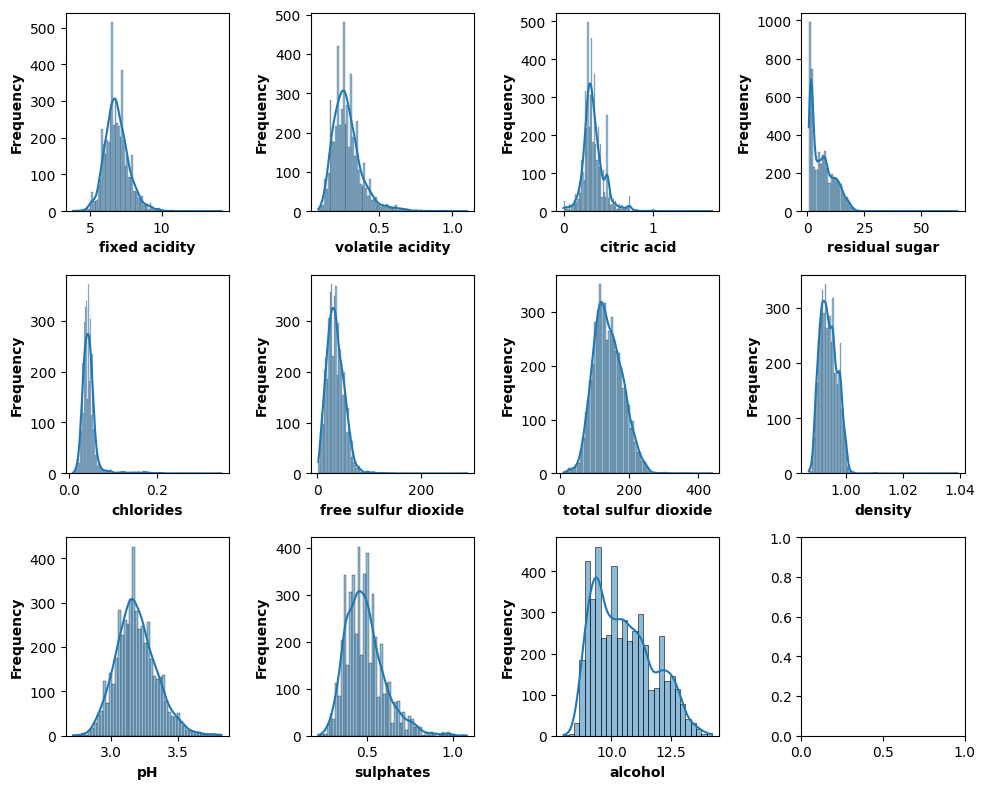

In [5]:
#Additional library used
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

variables_to_plot = wine.columns.drop('quality')

fig, axes = plt.subplots(3, 4, figsize=(10, 8))

row = 0
col = 0

for indx, var in enumerate(variables_to_plot):
    row = indx // 4
    col = indx % 4
    sns.histplot(wine[var], kde=True, ax=axes[row,col]) 
    axes[row,col].set_xlabel(var,fontweight='bold')
    axes[row,col].set_ylabel('Frequency',fontweight='bold')


plt.tight_layout()
plt.show()

## 2.3 Q-Q plots
To examine whether each parameter follows a normal distribution pattern.

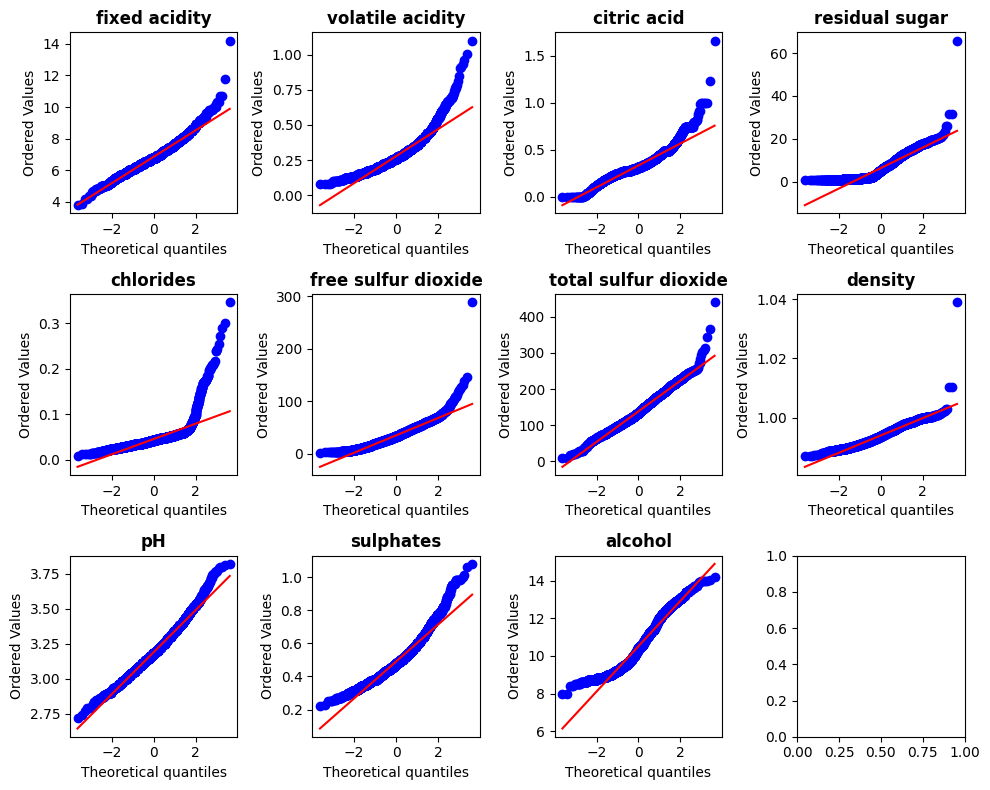

In [6]:
#Additional library used
import scipy.stats as stats

variables_to_plot= wine.columns.drop('quality')

fig, axes = plt.subplots(3, 4, figsize=(10, 8))

row = 0
col = 0

for indx, var in enumerate(variables_to_plot):
    row = indx // 4
    col = indx % 4
    data = wine[var]
    stats.probplot(data, dist="norm", plot=axes[row,col])
    axes[row,col].set_title(f'{var}',fontweight='bold')

plt.tight_layout()
plt.show()


## 2.4 Heatmap - Correlation matrix
To determine the correlation of the parameters given by the datasets.

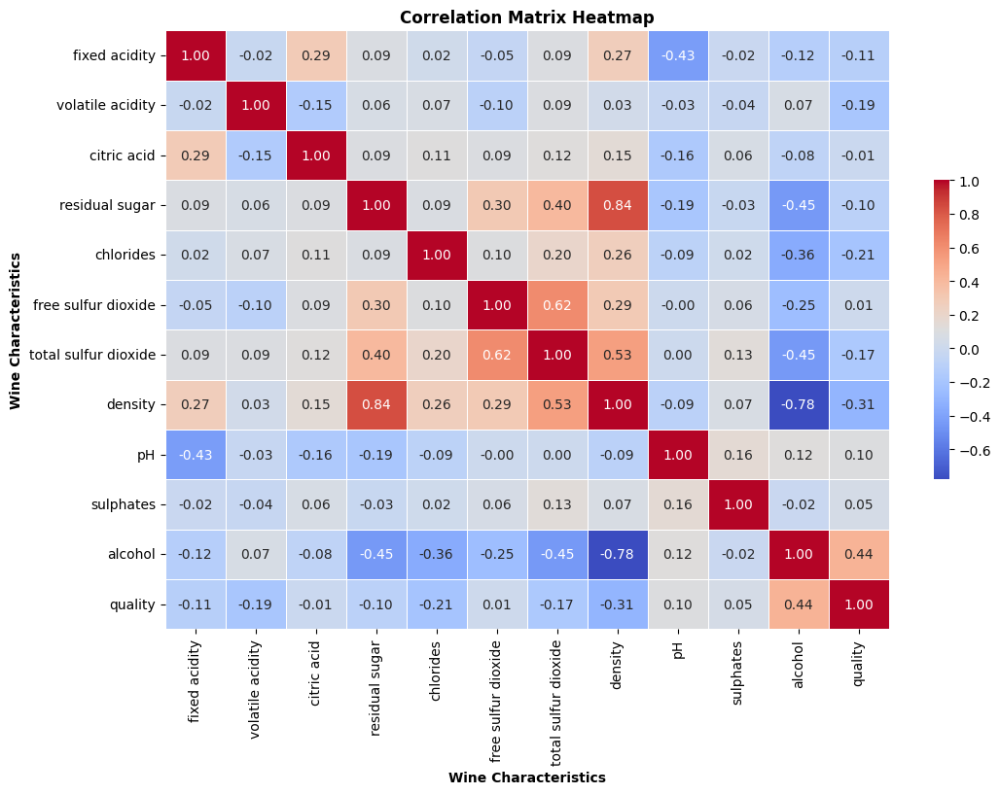

In [7]:
correlation_matrix = wine.corr()

plt.figure(figsize=(12, 8))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Matrix Heatmap',fontweight='bold')
plt.xlabel('Wine Characteristics',fontweight='bold')
plt.ylabel('Wine Characteristics',fontweight='bold')

plt.show()

## 2.5 Bar chart - Correlation with Quality rating
To visualise the correlation of each parameter with the quality rating

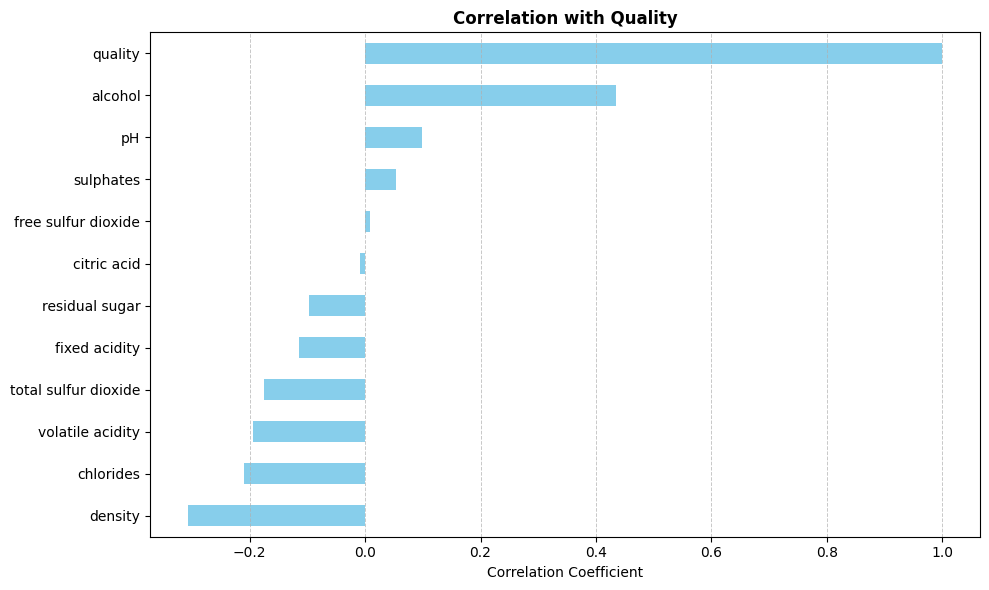

In [8]:
plt.figure(figsize=(10, 6))

quality_correlation = correlation_matrix['quality'].sort_values(ascending=False)

quality_correlation.plot(kind='barh', color='skyblue')

plt.title('Correlation with Quality', fontweight='bold')
plt.xlabel('Correlation Coefficient')

plt.grid(axis='x', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.gca().invert_yaxis()
plt.show()

# 3. Data Preprocessing

## 3.1. Missing data
To determine whether there is any missing data in the dataset.

In [9]:
print("Number of missing value for each variables:\n")

num_missing_values = wine.isnull().sum()
print(num_missing_values)

Number of missing value for each variables:

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


## 3.2 Duplicating data
To determine and remove the duplicated data from the dataset.

In [10]:
num_duplicated_data = wine.duplicated().sum()
print("Number of duplicating rows: ", num_duplicated_data)

Number of duplicating rows:  937


In [11]:
#Removing the duplicated data found
wine = wine.drop_duplicates()

num_duplicated_data = wine.duplicated().sum()
print("Number of duplicating rows (after removing): ", num_duplicated_data)

Number of duplicating rows (after removing):  0


## 3.3 Normalization
To normalise the parameter scale for averaging each parameter's impact on our project's result.

In [12]:
#Additional library used
from sklearn.preprocessing import StandardScaler

normalize_features = wine.drop(columns=['quality'])

# Apply Standardization (Z-score normalization)
scaler = StandardScaler()
normalized_wine = scaler.fit_transform(normalize_features)
normalized_wine = pd.DataFrame(normalized_wine, columns=normalize_features.columns)
normalized_wine['quality'] = wine['quality'].values

normalized_wine.head(None)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.185352,-0.101889,0.209651,3.041572,-0.039181,0.587571,0.760754,2.482748,-1.289928,-0.355488,-1.470396,6
1,-0.622262,0.188179,0.046294,-0.887634,0.133981,-1.213933,-0.120433,0.072470,0.689924,-0.003092,-0.895174,6
2,1.454460,-0.005199,0.536367,0.202669,0.177271,-0.284124,-0.932053,0.451228,0.425944,-0.443587,-0.402127,6
3,0.416099,-0.488646,-0.117064,0.531817,0.523594,0.703797,1.131781,0.623391,-0.036022,-0.795984,-0.566476,6
4,-0.737636,0.381558,-1.423927,0.223241,-0.039181,-0.284124,-0.027677,0.382363,-0.102017,-0.179290,-0.813000,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3956,-0.737636,-0.682025,-0.362101,-0.887634,-0.298924,-0.632803,-1.047999,-0.912301,0.491939,0.085008,0.501792,6
3957,-0.276142,0.381558,0.209651,0.428958,0.047400,1.284927,0.714376,0.382363,-0.300002,-0.267389,-0.813000,5
3958,-0.391515,-0.391957,-1.178890,-0.969921,-0.212343,-0.284124,-0.607405,-0.430245,-1.355923,-0.267389,-0.977349,6
3959,-1.545250,0.091490,-0.280422,-0.990493,-1.034861,-0.865255,-0.630594,-1.755898,0.953905,-0.972182,1.816584,7


## 3.4 Outlier
To remove the outlier that could negatively impact the result of our analysis.

In [13]:
#Additional library used
from sklearn.ensemble import IsolationForest

#Applying Isolation Forest model
IF_model = IsolationForest(n_estimators=100, contamination='auto', random_state=42)
IF_features = normalized_wine.drop('quality', axis=1)
IF_model.fit(IF_features)

outliers_wine = IF_model.predict(IF_features)
temp_wine = normalized_wine
temp_wine.loc[:,'outlier'] = outliers_wine

outliers_wine=temp_wine[temp_wine['outlier']==-1].drop('outlier', axis=1)
cleaned_wine = temp_wine[temp_wine['outlier'] == 1].drop('outlier', axis=1)

cleaned_wine.head(None)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.185352,-0.101889,0.209651,3.041572,-0.039181,0.587571,0.760754,2.482748,-1.289928,-0.355488,-1.470396,6
1,-0.622262,0.188179,0.046294,-0.887634,0.133981,-1.213933,-0.120433,0.072470,0.689924,-0.003092,-0.895174,6
2,1.454460,-0.005199,0.536367,0.202669,0.177271,-0.284124,-0.932053,0.451228,0.425944,-0.443587,-0.402127,6
3,0.416099,-0.488646,-0.117064,0.531817,0.523594,0.703797,1.131781,0.623391,-0.036022,-0.795984,-0.566476,6
4,-0.737636,0.381558,-1.423927,0.223241,-0.039181,-0.284124,-0.027677,0.382363,-0.102017,-0.179290,-0.813000,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3956,-0.737636,-0.682025,-0.362101,-0.887634,-0.298924,-0.632803,-1.047999,-0.912301,0.491939,0.085008,0.501792,6
3957,-0.276142,0.381558,0.209651,0.428958,0.047400,1.284927,0.714376,0.382363,-0.300002,-0.267389,-0.813000,5
3958,-0.391515,-0.391957,-1.178890,-0.969921,-0.212343,-0.284124,-0.607405,-0.430245,-1.355923,-0.267389,-0.977349,6
3959,-1.545250,0.091490,-0.280422,-0.990493,-1.034861,-0.865255,-0.630594,-1.755898,0.953905,-0.972182,1.816584,7


In [14]:
#Outliers removed
outliers_wine.head(None)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
10,1.685207,1.348451,2.333303,2.743281,-0.255633,0.355119,0.807133,2.207288,-1.421918,1.582693,-0.730825,5
34,-0.160768,-0.488646,0.454688,-0.702489,5.458702,1.633605,0.482485,-0.030828,-0.563982,-1.148381,-0.977349,6
35,-0.160768,-0.391957,0.454688,-0.620201,5.501993,1.633605,0.459296,-0.030828,-0.629977,-1.324579,-0.977349,6
47,-0.045395,-0.778714,2.088266,-1.031637,4.376442,0.180780,-0.120433,-0.271855,-0.959953,-0.972182,-1.223872,6
84,3.415809,0.768315,1.026441,0.943252,-0.342214,-1.795063,-1.256701,0.623391,-2.015874,-1.676975,-0.402127,4
...,...,...,...,...,...,...,...,...,...,...,...,...
3889,-0.968383,-0.101889,0.536367,-0.867063,-1.078151,-0.981481,-1.279890,-1.614725,0.293954,4.049469,2.090499,6
3906,-1.891371,1.203417,-1.505606,-0.918492,-0.342214,-1.446385,-2.161078,-0.874425,2.141816,-0.795984,0.830490,4
3914,-2.814359,2.508723,-1.995679,-0.167623,-0.342214,0.994362,-0.932053,-1.229080,1.415870,-0.795984,1.323537,7
3931,-1.775997,3.088859,0.046294,-0.928778,-0.645247,-1.853176,-1.790052,-1.807547,0.491939,-0.972182,1.980933,6


## 3.5. Resampling
To ensure we have likely equal number of samples for each quality rating to ensure fairness of our result.

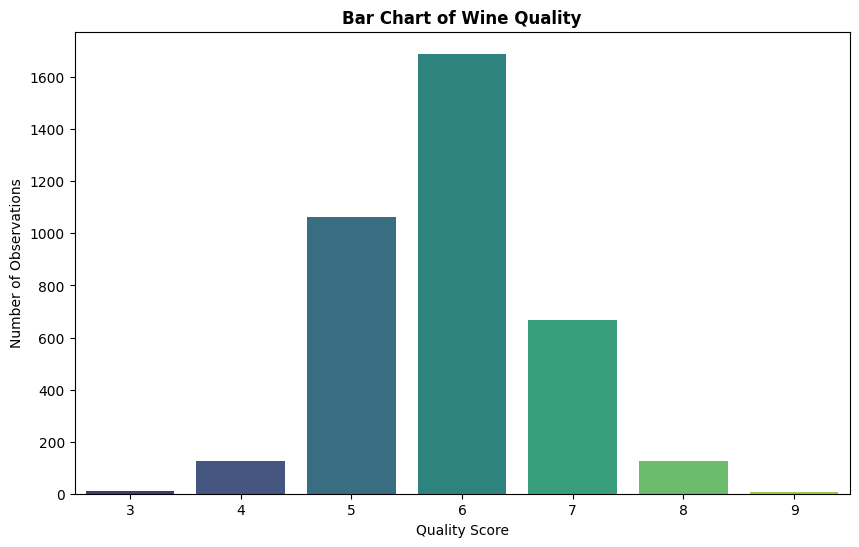

In [15]:
#Visualise the current number of samples for each quality rating
plt.figure(figsize=(10, 6))
sns.countplot(x='quality', data=cleaned_wine, palette='viridis')

plt.title('Bar Chart of Wine Quality', fontweight='bold')
plt.xlabel('Quality Score')
plt.ylabel('Number of Observations')
plt.show()

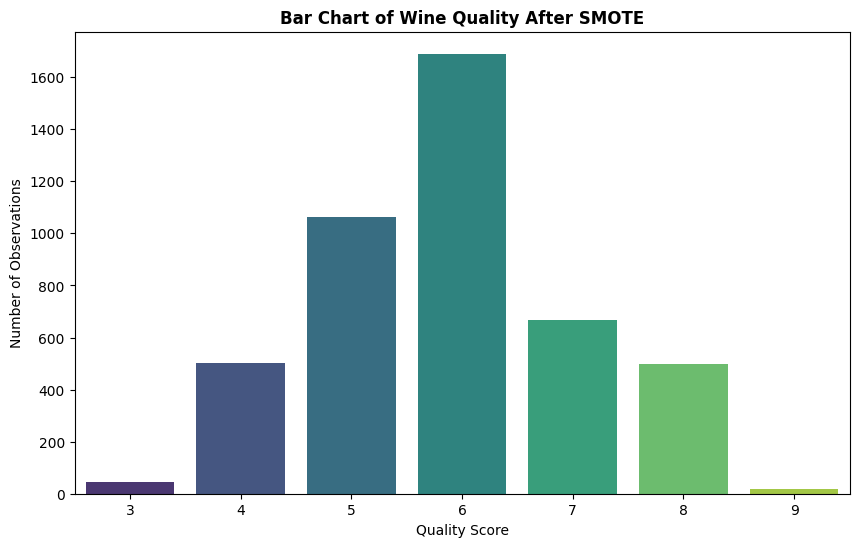

In [16]:
#Additional library used
from imblearn.over_sampling import SMOTE

X = cleaned_wine.drop('quality', axis=1)
y = cleaned_wine['quality']
majority_class_count = y.value_counts().max()

#Selecting the quality ratings require resampling to increase number of sample
current_count_3 = cleaned_wine[cleaned_wine['quality'] == 3].shape[0]
current_count_4 = cleaned_wine[cleaned_wine['quality'] == 4].shape[0]
current_count_8 = cleaned_wine[cleaned_wine['quality'] == 8].shape[0]
current_count_9 = cleaned_wine[cleaned_wine['quality'] == 9].shape[0]

#Setting the multuplier of the resampling
multiplier = 4
sampling_strategy = {
    3: min(current_count_3 * multiplier, majority_class_count),
    4: min(current_count_4 * multiplier, majority_class_count),
    8: min(current_count_8 * multiplier, majority_class_count),
    9: min(current_count_9 * multiplier, majority_class_count)
}
smallest_class_samples = min(current_count_3, current_count_4, current_count_8, current_count_9)
n_neighbors_smote = max(smallest_class_samples - 1, 1) 

# Applied SMOTE model to increase number of sample
smote = SMOTE(sampling_strategy=sampling_strategy, random_state=42, k_neighbors=n_neighbors_smote)
X_resampled, y_resampled = smote.fit_resample(X, y)
resampled_wine = pd.DataFrame(X_resampled, columns=X.columns)
resampled_wine['quality'] = y_resampled

#Visualise the updated number of samples for each quality rating
plt.figure(figsize=(10, 6))
sns.countplot(x='quality', data=resampled_wine, palette='viridis')
plt.title('Bar Chart of Wine Quality After SMOTE', fontweight='bold')
plt.xlabel('Quality Score')
plt.ylabel('Number of Observations')
plt.show()

## 3.6 Reclassifying the Quality Ratings of the Wine

Due to the significant imbalance of the sample size even after resampling by multiplying the minority sample with the multiplier factor of 4, we decided to reclassify the quality of the wine into three distinct levels only.

**The new quality ratings are:**

| Quality Level  | Initial Quality Ratings |
|:----------------|-------------------------:|
| Low quality (-1)   | 3, 4, 5                 |
| Medium quality (0) | 6                       |
| High quality (+1)  | 7, 8, 9                 |

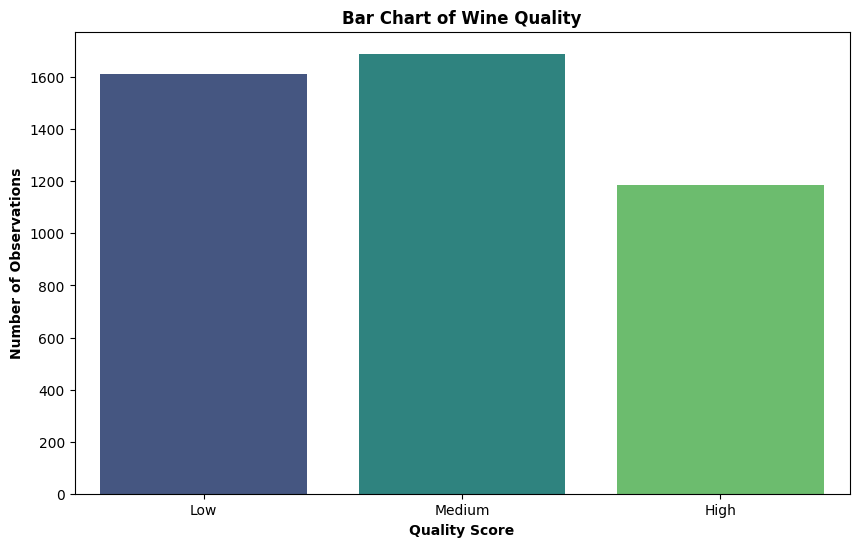

In [17]:
combined_wine = resampled_wine.copy()

# Combining the sample set
combined_wine['quality'] = combined_wine['quality'].apply(lambda x:-1 if x in [3, 4, 5] else (1 if x in [7, 8, 9] else 0))

# Visualise the data
combined_wine['quality_label'] = combined_wine['quality'].map({-1: 'Low', 0: 'Medium', 1: 'High'})
plt.figure(figsize=(10, 6))
category_order = ['Low', 'Medium', 'High']
sns.countplot(x='quality_label', data=combined_wine, palette='viridis', order=category_order)

plt.title('Bar Chart of Wine Quality', fontweight='bold')
plt.xlabel('Quality Score', fontweight='bold')
plt.ylabel('Number of Observations', fontweight='bold')
plt.show()

## 3.7 Final Dataset for analysis

In [18]:
# Final Dataset to be used for each model
final_wine = combined_wine.copy()
final_wine = final_wine.drop('quality_label', axis=1)

final_wine.head(None)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.185352,-0.101889,0.209651,3.041572,-0.039181,0.587571,0.760754,2.482748,-1.289928,-0.355488,-1.470396,0
1,-0.622262,0.188179,0.046294,-0.887634,0.133981,-1.213933,-0.120433,0.072470,0.689924,-0.003092,-0.895174,0
2,1.454460,-0.005199,0.536367,0.202669,0.177271,-0.284124,-0.932053,0.451228,0.425944,-0.443587,-0.402127,0
3,0.416099,-0.488646,-0.117064,0.531817,0.523594,0.703797,1.131781,0.623391,-0.036022,-0.795984,-0.566476,0
4,-0.737636,0.381558,-1.423927,0.223241,-0.039181,-0.284124,-0.027677,0.382363,-0.102017,-0.179290,-0.813000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4482,0.395249,0.565757,-0.057901,-0.456668,-0.937076,-0.578694,-0.999810,-0.836250,1.093273,0.746494,1.105329,1
4483,2.378216,-0.023043,0.863355,0.844532,-0.538766,-0.247653,-0.316452,0.880820,0.077810,-0.347213,0.015643,1
4484,1.181288,-0.161680,1.146798,-0.104764,-0.552396,-0.292542,-0.463685,-0.321158,0.723751,-0.485306,1.114785,1
4485,1.396987,-0.281017,0.490803,-0.128706,-0.579019,-0.436237,-0.091144,-0.266043,0.356009,-0.158580,0.910059,1


# 4. Linear Regression

## 4.1 Visualise Dataset Mathematica Summary

In [19]:
linear_wine = final_wine.copy()
linear_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000
mean,0.021202,-0.005020,-0.050103,-0.084051,-0.116157,-0.101539,-0.099689,-0.090218,0.016409,-0.055233,0.082496,-0.094718
std,0.952197,0.912955,0.874474,0.905867,0.599243,0.917311,0.936881,0.909810,0.962731,0.959459,0.993093,0.783914
min,-3.391226,-1.938986,-2.730789,-1.093352,-1.467765,-1.911289,-2.740807,-2.299932,-2.675825,-2.381769,-2.127792,-1.000000
25%,-0.622262,-0.604751,-0.525459,-0.887634,-0.472085,-0.749029,-0.785833,-0.815890,-0.629977,-0.795984,-0.730825,-1.000000
50%,-0.045395,-0.101889,-0.117064,-0.332197,-0.169052,-0.187715,-0.213190,-0.195194,-0.036022,-0.179290,-0.061045,0.000000
75%,0.531472,0.433339,0.373009,0.470102,0.133981,0.471345,0.552052,0.551038,0.623929,0.525503,0.830490,1.000000
max,8.492243,4.829267,10.827909,3.309005,6.021478,5.091330,3.126048,2.517181,4.121669,5.194758,2.967027,1.000000


## 4.2 Loading Training and Testing set

In [20]:
#Additional library used
from sklearn.model_selection import train_test_split

# Split the data into features (X) and target variable (y)
x = linear_wine.drop(columns=['quality'])
y = linear_wine['quality']

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

## 4.3 Application of linear regression model

In [21]:
#Additional library used
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Applying linear model
linear_model = LinearRegression()
linear_model.fit(x_train, y_train)

# Make predictions on the training set
y_train_pred = linear_model.predict(x_train)

# Evaluate the model on the training set
print(f"\033[1mEvaluation of the model on training set\033[0m")
print(f"Mean Squared Error : {mean_squared_error(y_train, y_train_pred):.4}")
print(f"R-squared score    : {r2_score(y_train, y_train_pred):.4}")

# Make predictions on the test set
y_test_pred = linear_model.predict(x_test)

# Evaluate the model on the test set
print(f"\n\033[1mEvaluation of the model on testing set\033[0m")
print(f"Mean Squared Error : {mean_squared_error(y_test, y_test_pred):.4}")
print(f"R-squared score    : {r2_score(y_test, y_test_pred):.4}")

# Use the model to predict on the whole dataset
all_predictions = linear_model.predict(x)

Evaluation of the model on training set
Mean Squared Error : 0.3747
R-squared score    : 0.3894

Evaluation of the model on testing set
Mean Squared Error : 0.3722
R-squared score    : 0.3956


***Result Analysis:***

The linear regression model built has a consistent performance on both the training and testing datasets, as evidenced by similar values for the mean squared error (MSE) and the R-squared score on each. This could suggests that the model has a low variance by generalized well from the training data to the unseen testing data

## 4.4 Evaluate the over performance of inear regression model

In [22]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y, all_predictions)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y, all_predictions)

# Calculate Root Mean Squared Error (RMSE)
rmse = mean_squared_error(y, all_predictions, squared=False)

# Calculate R-squared (R2) Score
r2 = r2_score(y, all_predictions)

print(f"\n\033[1mEvaluation of the model on overall dataset\033[0m")
print(f"Mean Absolute Error            : {mae:.4}")
print(f"Mean Squared score             : {mse:.4}")
print(f"Root Mean Squared Error (RMSE) : {rmse:.4}")
print(f"R-squared (R2) Score           : {r2*100:.4}%")


Evaluation of the model on overall dataset
Mean Absolute Error            : 0.5047
Mean Squared score             : 0.374
Root Mean Squared Error (RMSE) : 0.6115
R-squared (R2) Score           : 39.13%


***Result Analysis:***

Lower MAE, MSE, and RMSE values indicate better accuracy, while higher R2 score (1) indicates better goodness of fit

MAPE: Not suitable for linear regression models, especially if the target variable has values close to zero, as it can result in division by zero or very large errors.

Categorical Accuracy: Since linear regression predicts continuous values, categorical accuracy is not directly applicable.

Spearman's Rank Correlation Coefficient and Kendall's Tau: These metrics measure the strength and direction of association between two ranked variables. They can be used to evaluate the monotonic relationship between the predicted and actual values in regression tasks. However, they are not as commonly used as metrics like MSE, MAE, and R-squared.

## 4.5 Determine the Coefficients of each features in the Linear Regression Model

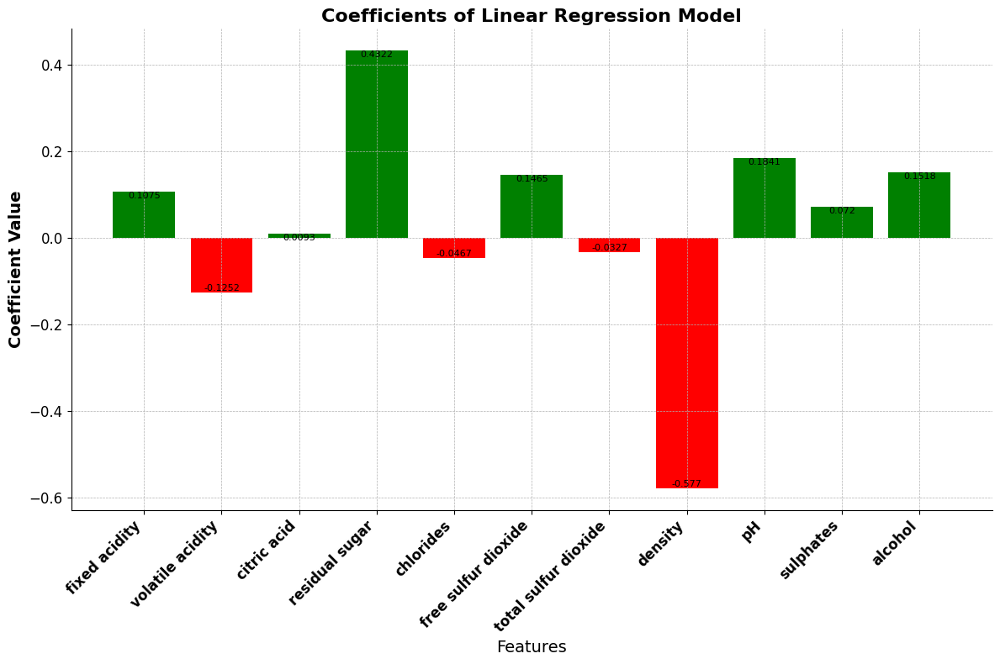

In [23]:
# Coefficients and feature names
feature_names = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                 'pH', 'sulphates', 'alcohol']

coefficients = linear_model.coef_  # Replace with your model's coefficients

# Plotting the coefficients
colors = ['red' if coef < 0 else 'green' for coef in coefficients]

plt.figure(figsize=(12, 8))
bars = plt.bar(feature_names, coefficients, color=colors)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), va='bottom' if yval < 0 else 'top', ha='center', fontsize=8)

plt.title('Coefficients of Linear Regression Model', fontsize=16,fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Coefficient Value', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=12,fontweight='bold')
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

***Result Analysis:***

From the coefficients graph displayed, we observed that 'residual sugar' exhibits the strongest positve relationship with our model, while 'density' shows the strongest negative relationship. This indicates that both are the most important features used by the linear regression model in predicting wine quality ratings.

## 4.6 Visualise the result of Linear Regression model

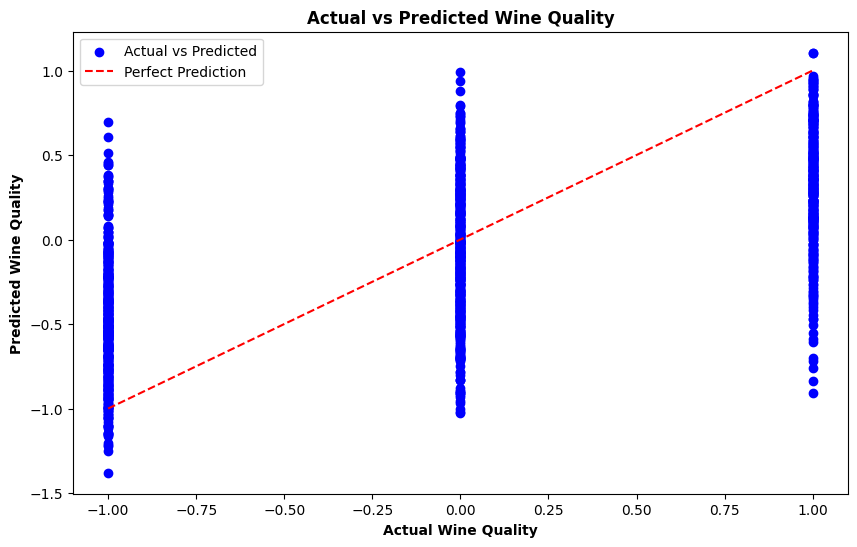

In [24]:
# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Actual vs Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Wine Quality',fontweight='bold')
plt.ylabel('Predicted Wine Quality',fontweight='bold')
plt.title('Actual vs Predicted Wine Quality',fontweight='bold')
plt.legend()
plt.show()


## 4.7 Improving the model by further standardize the features's scale

Standard Scaler: Standardize input data in a way that ensures that the data points have a balanced scale (removing the mean and scaling to unit variance)

Ridge Regression: Regularization for linear regression models (reduce errors caused by overfitting on training data - specifically corrects for multicollinearity [two or more independent variables are highly correlated])

Best alpha: 1



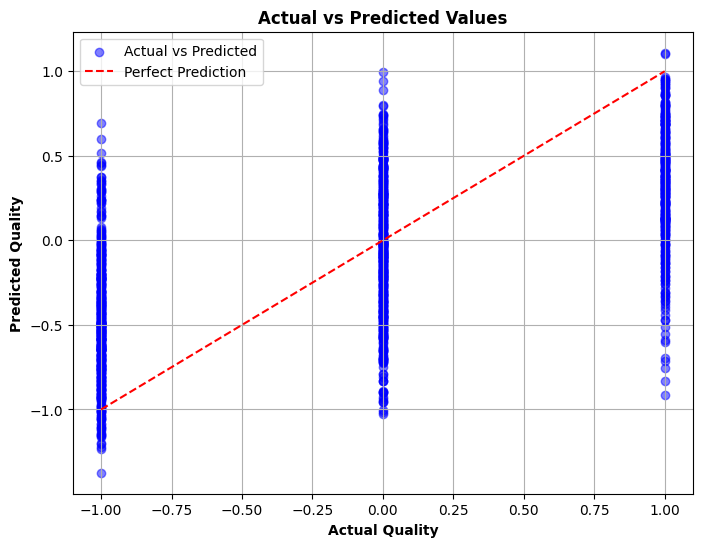


Evaluation of the model on overall dataset
Mean Absolute Error            : 0.504
Mean Squared score             : 0.3727
Root Mean Squared Error (RMSE) : 0.6105
R-squared (R2) Score           : 39.49%
Cross-validated MSE            : -0.3941


In [25]:
#Additional library used
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Standardize the features
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Perform feature selection using SelectKBest with cross-validation
selector = SelectKBest(score_func=f_regression)
x_selected = selector.fit_transform(x_scaled, y)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_selected, y, test_size=0.3, random_state=0)

# Apply Ridge Regression with regularization using GridSearchCV for hyperparameter tuning
ridge_model = Ridge()
param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10]}
grid_search = GridSearchCV(ridge_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)

# Get the best hyperparameters
best_alpha = grid_search.best_params_['alpha']

# Print best hyperparameters
print(f"\033[1mBest alpha: {best_alpha}\033[0m\n")

# Variable for conclusion
LR_y_test_pred = grid_search.best_estimator_.predict(x_test)
LR_y_test = y_test

# Plotting the actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(LR_y_test, LR_y_test_pred, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot([min(LR_y_test), max(LR_y_test)], [min(LR_y_test), max(LR_y_test)], color='red', linestyle='--', label='Perfect Prediction')
plt.title('Actual vs Predicted Values',fontweight='bold')
plt.xlabel('Actual Quality',fontweight='bold')
plt.ylabel('Predicted Quality',fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the testing set
LR_mae = mean_absolute_error(LR_y_test, LR_y_test_pred)
LR_mse = mean_squared_error(LR_y_test, LR_y_test_pred)
LR_rmse = mean_squared_error(LR_y_test, LR_y_test_pred, squared=False)
LR_r2 = r2_score(LR_y_test,  LR_y_test_pred)
 
print(f"\n\033[1mEvaluation of the model on overall dataset\033[0m")
print(f"Mean Absolute Error            : {LR_mae:.4}")
print(f"Mean Squared score             : {LR_mse:.4}")
print(f"Root Mean Squared Error (RMSE) : {LR_rmse:.4}")
print(f"R-squared (R2) Score           : {LR_r2*100:.4}%")

# Perform cross-validation with the best model
LR_cv_score = cross_val_score(grid_search.best_estimator_, x_selected, y, cv=5, scoring='neg_mean_squared_error')
print(f"Cross-validated MSE            : {LR_cv_score.mean():.4f}")



# 5. k-Mean Custering Model

## 5.1 Determining the Parameters for k-Means Clustering with k = 3

1. We selected `k = 3` for k-means clustering to correspond with the three new quality ratings: low, medium, and high.
2. We computed the average quality rating for each cluster to determine the overall quality profile of that cluster.
3. We repeated the k-means clustering using various combinations of parameters to identify the set that most accurately splits the data into three distinct quality clusters.


In [26]:
#Special Notes: This part will take around 10 minutes run time

#Additional library used
from sklearn.cluster import KMeans
from itertools import combinations

kmeans_wine = final_wine.copy()

#List of parameter given
all_features = ['alcohol', 'density', 'chlorides', 'volatile acidity','total sulfur dioxide', 'fixed acidity', 
                'residual sugar', 'pH', 'sulphates', 'citric acid', 'free sulfur dioxide',]

#Function for labelling the overall quality rating of the cluster
def map_avg_quality_to_label(avg_quality):
    if avg_quality <= -0.5:
        return -1
    elif -0.5 < avg_quality <= 0.5:
        return 0
    else:
        return 1

#DataFrame to record the results for different combination of parameter
kmeans_result = pd.DataFrame(columns=['Features', 'Low quality - purity', 'Medium quality - purity', 
                                      'High quality - purity', 'Overall purity', 'No. of clusters formed'])

#Applying k-Menas clustering model
for r in range(1, len(all_features) + 1):
    for feature_combination in combinations(all_features, r):
        kmeans_features = kmeans_wine[list(feature_combination)]

        kmeans = KMeans(n_clusters=3, random_state=18)
        kmeans_wine['cluster'] = kmeans.fit_predict(kmeans_features)

        average_quality = kmeans_wine.groupby('cluster')['quality'].mean()
        cluster_mapping = average_quality.apply(map_avg_quality_to_label)
        kmeans_wine['cluster_label'] = kmeans_wine['cluster'].map(cluster_mapping)

        kmeans_wine['match'] = kmeans_wine['quality'] == kmeans_wine['cluster_label']
        overall_purity = 0
        purity_dict = {}
        num_clusters_formed = len(kmeans_wine['cluster_label'].unique())

        for i in range(-1, 2):
            cluster_data = kmeans_wine[kmeans_wine['cluster_label'] == i]
            num_total = len(cluster_data)
            num_match = cluster_data['match'].sum()
            purity = num_match / num_total * 100 if num_total > 0 else 0
            purity_dict[f'Cluster {i} Purity'] = purity
            overall_purity += purity

        overall_purity /= num_clusters_formed

        kmeans_result = pd.concat([
            kmeans_result,
            pd.DataFrame([{
                'Features': feature_combination,
                'Low quality - purity': purity_dict.get('Cluster -1 Purity'),
                'Medium quality - purity': purity_dict.get('Cluster 0 Purity'),
                'High quality - purity': purity_dict.get('Cluster 1 Purity'),
                'Overall purity': overall_purity,
                'No. of clusters formed': num_clusters_formed
            }])
        ], ignore_index=True)

#Filtered the result by number of clusters formed & Sorted by overall purity
kmeans_result_filtered = kmeans_result[kmeans_result['No. of clusters formed'] == 3]
kmeans_result_filtered = kmeans_result_filtered.sort_values(by='Overall purity', ascending=False)

kmeans_result_filtered.head()

,Features,Low quality - purity,Medium quality - purity,High quality - purity,Overall purity,No. of clusters formed
0,"(alcohol,)",58.053302,43.028127,60.366972,53.816134,3
12,"(alcohol, chlorides)",58.772474,43.372093,59.098787,53.747785,3


In [27]:
#Display the detail of combination selected
selected_features = kmeans_result_filtered.loc[12]

print(f"\033[1mFeature selected:\033[0m")
print(' ',', '.join(selected_features['Features']))
print(f"\nCluster with Low    quality's purity: {selected_features['Low quality - purity']:.2f}%")
print(f"Cluster with Medium quality's purity: {selected_features['Medium quality - purity']:.2f}%")
print(f"Cluster with High   quality's purity: {selected_features['High quality - purity']:.2f}%\n")
print(f"\033[1mOverall purity: {selected_features['Overall purity']:.2f}%\033[0m")

Feature selected:
  alcohol, chlorides

Cluster with Low    quality's purity: 58.77%
Cluster with Medium quality's purity: 43.37%
Cluster with High   quality's purity: 59.10%

Overall purity: 53.75%


## 5.2 Result of k-Mean Clustering Model

Feature selected:
  alcohol, chlorides


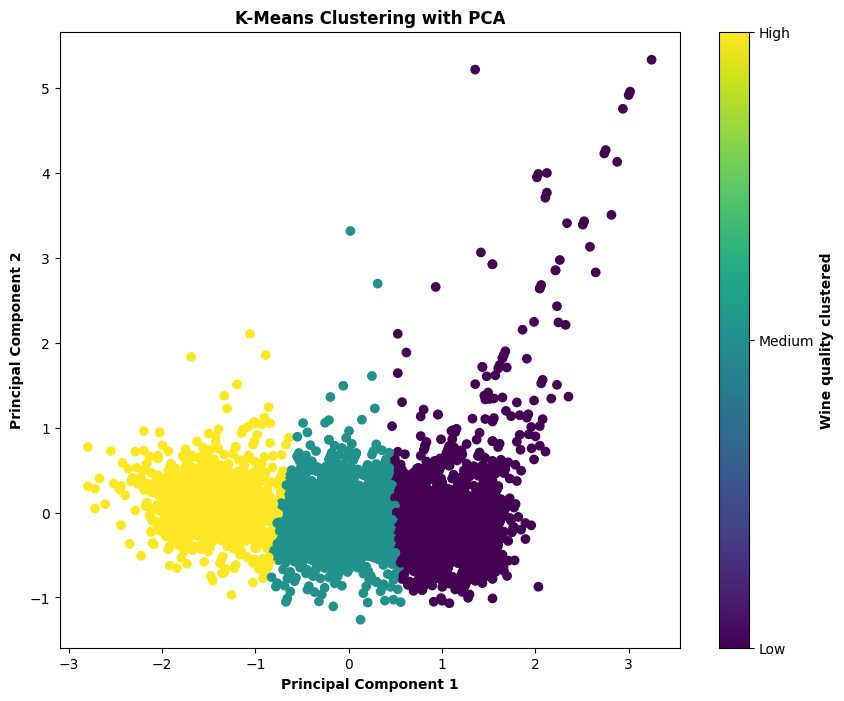

Cluster with Low    quality's purity: 58.7725%
Cluster with Medium quality's purity: 43.3721%
Cluster with High   quality's purity: 59.0988%

Overall purity                     : 53.7478%
Mean of Squared Errors (MSE)       : 0.3907
Averaged distance between centroids: 1.6797
Silhouette Score                   : 0.4326




In [28]:
#Additional library used
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import euclidean_distances

#Function for labelling the overall quality rating of the cluster
def map_avg_quality_to_label(avg_quality):
    if avg_quality <= -0.5:
        return -1
    elif -0.5 < avg_quality <= 0.5:
        return 0
    else:
        return 1

#Parameter selected
features = ['alcohol', 'chlorides']
            
print(f"\033[1mFeature selected:\033[0m")
print(' ',', '.join(features))

#Applying k-Means Clustering model (k=3)
kmeans_features = kmeans_wine[features]
kmeans = KMeans(n_clusters=3, random_state=18)
kmeans_wine['cluster'] = kmeans.fit_predict(kmeans_features)

average_quality = kmeans_wine.groupby('cluster')['quality'].mean()
cluster_mapping = average_quality.apply(map_avg_quality_to_label)
kmeans_wine['cluster_label'] = kmeans_wine['cluster'].map(cluster_mapping)


# Visualise the result with PCA for Dimensionality Reduction
pca = PCA(n_components=2)
principal_components = pca.fit_transform(kmeans_wine[features])

unique_labels = sorted(kmeans_wine['cluster_label'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
plt.figure(figsize=(10, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1],
                      c=kmeans_wine['cluster_label'], cmap=plt.get_cmap('viridis'))

colorbar = plt.colorbar(scatter, ticks=np.arange(min(unique_labels), max(unique_labels)+1))
colorbar.set_label('Wine quality clustered',fontweight='bold')
colorbar.set_ticklabels(['Low', 'Medium', 'High'])

plt.xlabel('Principal Component 1',fontweight='bold')
plt.ylabel('Principal Component 2',fontweight='bold')
plt.title('K-Means Clustering with PCA',fontweight='bold')

plt.show()


# Computing and printing the purity of each clustering
kmeans_wine['match'] = kmeans_wine['quality'] == kmeans_wine['cluster_label']
overall_purity = 0
num_clusters_formed = len(kmeans_wine['cluster_label'].unique())

for i in range(-1, 2):
    cluster_data = kmeans_wine[kmeans_wine['cluster_label'] == i]
    num_total = len(cluster_data)
    num_match = cluster_data['match'].sum()
    purity = num_match / num_total * 100 if num_total > 0 else 0

    if i == -1:
        q ='Low   '
    elif i == 0:
        q = 'Medium'
    else:
        q = 'High  '

    print(f"Cluster with {q} quality's purity: {purity:.4f}%")
    overall_purity += purity

overall_purity /= num_clusters_formed


#Computing the average distance between each cluster's centriods
centroids = kmeans.cluster_centers_
distances = euclidean_distances(centroids)

inter_cluster_distances = []
for i in range(len(distances)):
    for j in range(i+1, len(distances)):
        inter_cluster_distances.append(distances[i][j])

average_distance = sum(inter_cluster_distances) / len(inter_cluster_distances)


# Printing the evaluating factor for the model
print(f"\n\033[1mOverall purity                     : {overall_purity:.4f}%\033[0m") 
print(f"\033[1mMean of Squared Errors (MSE)       : {kmeans.inertia_/kmeans_features.shape[0]:.4f}")
print(f"\033[1mAveraged distance between centroids: {average_distance:.4f}\033[0m")
print(f"\033[1mSilhouette Score                   : {silhouette_score(kmeans_features,kmeans_wine['cluster_label'] ):.4f}\033[0m\n\n")


***Result Analysis:***

The PCA graph demonstrates that the k-Means clustering has delineated a clear boundary, splitting the dataset into three groups corresponding to different levels of quality ratings.

A low Mean Squared Error (MSE) suggests that each cluster has relatively high intra-group similarity, while the high average distance between centroids indicates a low inter-group similarity. Thus, the k-Means model is considered effective, which is supported by the high Silhouette score that accounts for both intra-group and inter-group similarities.

However, an overall purity of 53.75% indicates some limitations when applying the k-Means clustering model to this dataset. One possible limitation could be the characteristic tendency of k-Means to form globular clusters.

To address these limitations, we reimplemented the k-Means model with an increased value of k and conducted post-processing to combine clusters based on average quality rating.



## 5.3 Reimplement the k-Means clustering model with increase in k
To address the limitation of k-Means (forming globular cluster), we increased value of `k = 6` (two times) and conduct a post-process by combine the cluster based on averaged quality rating.

Feature selected:
  alcohol, chlorides


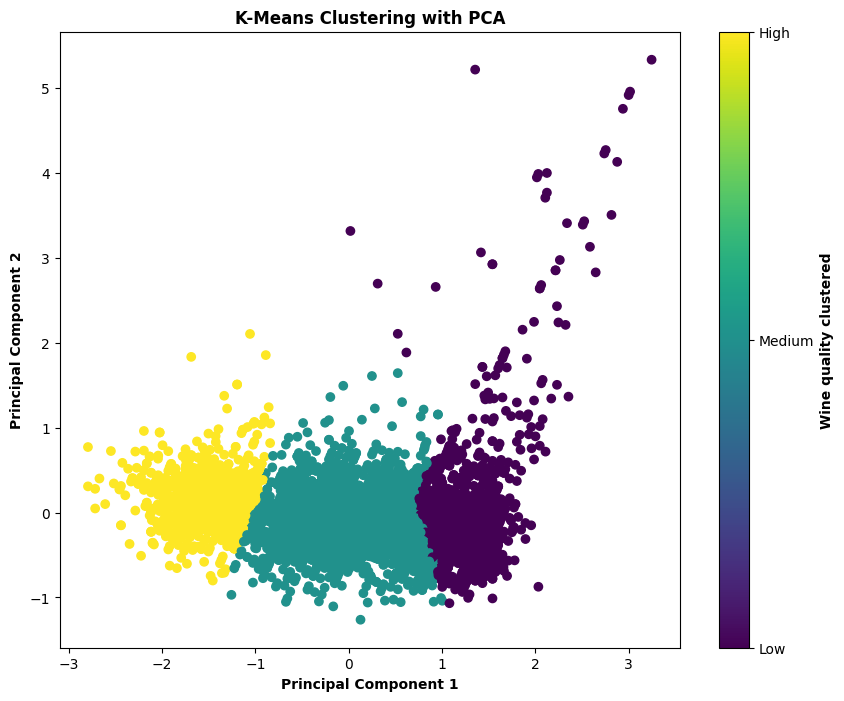

Cluster with Low    quality's purity: 62.2483%
Cluster with Medium quality's purity: 43.2120%
Cluster with High   quality's purity: 63.3333%

Overall purity                     : 56.2645%
Mean of Squared Errors (MSE)       : 0.2009
Averaged distance between centroids: 2.0047
Silhouette Score                   : 0.4024




In [29]:
#Function for labelling the overall quality rating of the cluster
def map_avg_quality_to_label(avg_quality):
    if avg_quality <= -0.5:
        return -1
    elif -0.5 < avg_quality <= 0.5:
        return 0
    else:
        return 1

#Parameter selected
final_features = ['alcohol', 'chlorides']
            
print(f"\033[1mFeature selected:\033[0m")
print(' ',', '.join(features))

#Applying k-Means Clustering model (k=3)
kmeans_features = kmeans_wine[features]
kmeans = KMeans(n_clusters=6, random_state=18)
kmeans_wine['cluster'] = kmeans.fit_predict(kmeans_features)

average_quality = kmeans_wine.groupby('cluster')['quality'].mean()
cluster_mapping = average_quality.apply(map_avg_quality_to_label)
kmeans_wine['cluster_label'] = kmeans_wine['cluster'].map(cluster_mapping)


# Visualise the result with PCA for Dimensionality Reduction
pca = PCA(n_components=2)
principal_components = pca.fit_transform(kmeans_wine[final_features])

unique_labels = sorted(kmeans_wine['cluster_label'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
plt.figure(figsize=(10, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1],
                      c=kmeans_wine['cluster_label'], cmap=plt.get_cmap('viridis'))
colorbar = plt.colorbar(scatter, ticks=np.arange(min(unique_labels), max(unique_labels)+1))
colorbar.set_label('Wine quality clustered',fontweight='bold')
colorbar.set_ticklabels(['Low', 'Medium', 'High'])

plt.xlabel('Principal Component 1',fontweight='bold')
plt.ylabel('Principal Component 2',fontweight='bold')
plt.title('K-Means Clustering with PCA',fontweight='bold')

plt.show()


# Computing and printing the purity of each clustering
kmeans_wine['match'] = kmeans_wine['quality'] == kmeans_wine['cluster_label']
overall_purity = 0
num_clusters_formed = len(kmeans_wine['cluster_label'].unique())

quality_purity = {}

for i in range(-1, 2):
    cluster_data = kmeans_wine[kmeans_wine['cluster_label'] == i]
    num_total = len(cluster_data)
    num_match = cluster_data['match'].sum()
    purity = num_match / num_total * 100 if num_total > 0 else 0

    if i == -1:
        q ='Low   '
    elif i == 0:
        q = 'Medium'
    else:
        q = 'High  '

    print(f"Cluster with {q} quality's purity: {purity:.4f}%")
    overall_purity += purity
    quality_purity[q] = purity

overall_purity /= num_clusters_formed


#Computing the average distance between each cluster's centriods
centroids = kmeans.cluster_centers_
distances = euclidean_distances(centroids)

inter_cluster_distances = []
for i in range(len(distances)):
    for j in range(i+1, len(distances)):
        inter_cluster_distances.append(distances[i][j])

average_distance = sum(inter_cluster_distances) / len(inter_cluster_distances)

# Variable for conclusion
km_overall_purity = overall_purity
km_mse = kmeans.inertia_/kmeans_features.shape[0]
km_ad = average_distance
km_ss = silhouette_score(kmeans_features,kmeans_wine['cluster_label'] )

# Printing the evaluating factor for the model
print(f"\n\033[1mOverall purity                     : {km_overall_purity:.4f}%\033[0m") 
print(f"\033[1mMean of Squared Errors (MSE)       : {km_mse:.4f}")
print(f"\033[1mAveraged distance between centroids: {km_ad:.4f}\033[0m")
print(f"\033[1mSilhouette Score                   : {km_ss:.4f}\033[0m\n\n")


***Result Analysis:***

By doubling the value of 'k' to 6, we managed to increase the overall purity from 53.75% to 55.53%.

While the increase in purity is modest, the decrease in Mean Squared Errors (MSE) and the increase in the average distance between centroids suggest that increasing the value of 'k' has improved the results as clusters are becoming more compact and better separated.

However, the slight decrease in silhouette score indicates that despite the clusters being more compact, they might not be as well-separated as would be ideal. This highlights the delicate balance required when selecting the number of clusters.

Increasing the value of 'k' does improve the overall purity, indicating a better clustering result. However, 'k' cannot be increased excessively, as it could lead to overfitting, where the model starts to memorize the data rather than generalizing from it.

## 5.4 Conclusion of k-Means clustering model

Overall, the k-Means clustering model does not perform optimally with our dataset. Despite comprehensive pre-processing and post-processing efforts, the highest purity achieved by the model is only 55.53%. This suboptimal performance could be attributed to the limitation of k-Means clustering, such as sentivity to shape, density, choice of number of cluster (k). Additionally, it is possible that our dataset does not exhibit a clear-cut relationship that k-Means can leverage for clustering.

# 6. Deciscion Tree Classifer

## 6.1 Loading Training and Test Data

In [30]:
#Allocate 20% of the data set for testing
split_wine = final_wine
trainingData, testingData = train_test_split(split_wine, test_size = 0.2, random_state = 0)

# We define the Y-axis to contain the wine quality, and X-axis to contain the parameters contributing to that quality
X_train = trainingData.drop(["quality"], axis = 1)  
Y_train = trainingData["quality"]                   
X_test  = testingData.drop(["quality"], axis = 1)
Y_test  = testingData["quality"]

## 6.2 Determine which model to apply

In [31]:
#Additional library used
from sklearn.tree import DecisionTreeClassifier

#Gini Model
dt_gini = DecisionTreeClassifier(criterion = "gini", random_state = 0)
dt_gini.fit(X_train, Y_train)
dt_gini.predict(X_test)

#Entropy Model
dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 0)
dt_entropy.fit(X_train, Y_train)
dt_entropy.predict(X_test)

#Printing the result
print(f"Gini Model's accuracy   : {dt_gini.score(X_test, Y_test)*100:.2f}%")
print(f"Entropy Model's accuracy: {dt_entropy.score(X_test, Y_test)*100:.2f}%")

Gini Model's accuracy   : 60.13%
Entropy Model's accuracy: 53.90%


***Result Analysis:***

As the gini model has better accuracy than the entropy model, we will use the gini model first to predict the wine qualities, and optimize the decision tree classifier further later. The choice of a model will not really impact the final model being used.

## 6.3 Rank the importances of each feature

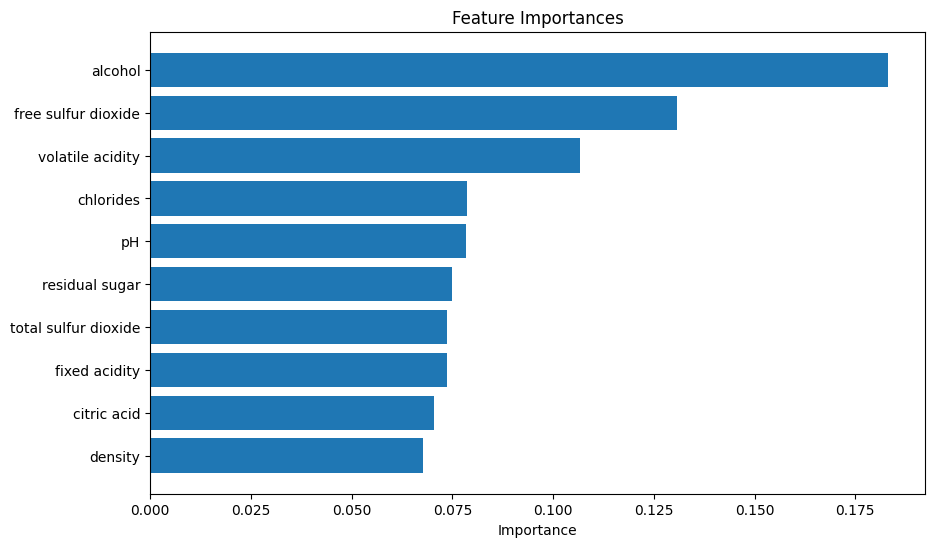

In [32]:
#Applied the decision tree classifier
dt_model = DecisionTreeClassifier(criterion = "gini", random_state = 0)
dt_model.fit(X_train, Y_train)

# Ranked the importance of each feature
feature_importance = dt_model.feature_importances_
feature_importance_dict = dict(zip(X_train.columns, feature_importance))
sorted_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_importance[:10])
plt.figure(figsize=(10, 6))
plt.barh(range(len(features)), importances, align='center')
plt.yticks(range(len(features)), features)
plt.xlabel('Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  

## 6.4 Visiualise the Decision Tree

In [33]:
#Additional library used
import pydotplus
from sklearn import tree
from IPython.display import Image


# Plot the decision tree
dot_data = tree.export_graphviz(dt_model,
                                feature_names = X_train.columns,
                                class_names   = [str(i) for i in set (Y_train)],
                                filled        = True,
                                out_file      = None)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.573662 to fit



## 6.5 Result of Decision tree's prediction

In [34]:
#Applied the model
predictions = dt_model.predict(X_test)
results     = pd.concat([testingData.reset_index(drop = True),
                         pd.Series(predictions, name = "Predicted Class")], axis = 1)

# Decision Tree Model Testing Accuracy
print(f"\033[1mModel Testing Accuracy: {dt_model.score(X_test, Y_test)*100:.2f}%\033[0m") 
print("(the higher the better)\n")

# Decision Tree Model Training Accuracy
print(f"\033[1mModel Training Accuracy: {dt_model.score(X_train, Y_train)*100:.2f}%\033[0m") 
print("(too high will not be better, is better if testing > training)")


Model Testing Accuracy: 60.13%
(the higher the better)

Model Training Accuracy: 100.00%
(too high will not be better, is better if testing > training)


***Result Analysis:***

The decision tree model has only 60% testing accuracy and 100% training accuracy. This makes sense, as an unoptimized decision tree model that is allowed to work to its fullest potential will inherently overfit. 

To fix this issue, we will try to conduct post-pruning methods using cost-complexity alphas. Cost-complexity alphas is used not only because it is built into the DecisionTreeClassifier in scikit, but also because it is pretty efficient in finding out the optimal level of pruning we have to do without spending too much resources to make that decision.

## 6.6 Handing overfitting issue with Cost-complexity Pruning (CCP)

### 6.6.1 Compute and visualise the CCP path 

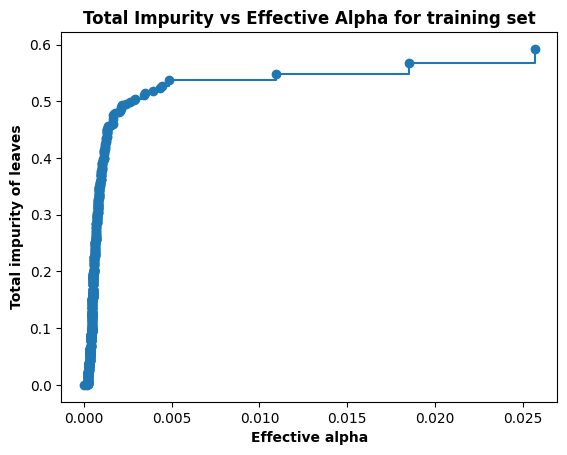

In [35]:
# Compute the cost-complexity pruning path
path = dt_model.cost_complexity_pruning_path(X_train, Y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# Plot the pruning path
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("Effective alpha",fontweight='bold')
ax.set_ylabel("Total impurity of leaves",fontweight='bold')
ax.set_title("Total Impurity vs Effective Alpha for training set",fontweight='bold')

plt.show()

### 6.6.2 Compute the number of node in the last tree & CPP's Alpha

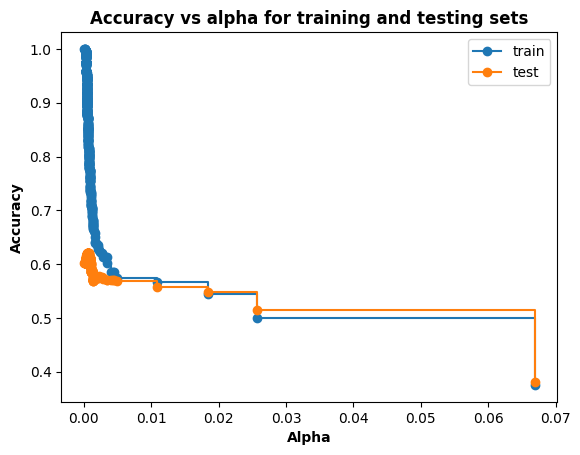

Number of nodes in the last tree is: 1
CPP's Alpha                        : 0.0669


In [36]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, Y_train)
    clfs.append(clf)

train_scores = [clf.score(X_train, Y_train) for clf in clfs]
test_scores = [clf.score(X_test, Y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("Alpha",fontweight='bold')
ax.set_ylabel("Accuracy",fontweight='bold')
ax.set_title("Accuracy vs alpha for training and testing sets",fontweight='bold')
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()
                
                
print("Number of nodes in the last tree is: {}".format(clfs[-1].tree_.node_count))
                                
print("CPP's Alpha                        : {:.4f}".format(ccp_alphas[-1]))

### 6.6.3 Find the optimal value for CPP's Alpha

In [37]:
optimal_ccp_alpha = ccp_alphas[np.argmin(impurities)]
print("Optimal value of CPP's Alpha: {:.4f}".format(optimal_ccp_alpha))

Optimal value of CPP's Alpha: 0.0000


### 6.6.4 Visualise the current parameter used for decision tree

In [38]:
#Additional library used
from pprint import pprint

dt_estimator = DecisionTreeClassifier(random_state=0)
params_df = pd.DataFrame([dt_estimator.get_params()])

#Visualise the paraments used
params_df = params_df.transpose()
params_df.columns = ['Value']
params_df


,Value
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2
min_weight_fraction_leaf,0.0


### 6.6.5 List of possible parameter be used for decision tree

In [39]:
# Number of features to consider at every split
max_features = ['sqrt', 'log2']
max_features.append(None)

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(2, 14, num = 7)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of measuring the quality of a split.
criterion = ['gini', 'entropy']

# Create the random grid
random_grid = {'criterion': criterion,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features,}

# Visualisation
random_grid_df = pd.DataFrame.from_dict(random_grid, orient='index')
random_grid_df

,0,1,2,3,4,5,6,7
criterion,gini,entropy,NaN,NaN,NaN,NaN,NaN,None
max_depth,2,4,6.0,8.0,10.0,12.0,14.0,None
min_samples_split,2,5,10.0,NaN,NaN,NaN,NaN,None
min_samples_leaf,1,2,4.0,NaN,NaN,NaN,NaN,None
max_features,sqrt,log2,NaN,NaN,NaN,NaN,NaN,None


### 6.6.6 Finding the best parameter to be used for decision tree

In [40]:
#Additional library used
from sklearn.model_selection import RandomizedSearchCV

#First create the base model to tune
dt = DecisionTreeClassifier(random_state=0)

#Random search of parameters, using 3 fold cross validation, search across 10 different combinations, and use all available cores
dt_random = RandomizedSearchCV(
    estimator=dt,
    param_distributions=random_grid,
    n_iter=10,
    cv=3,
    verbose=2,
    random_state=0,
    n_jobs=-1
)

#Fit the random search model
dt_random.fit(X_train,Y_train)

#Visualise the result
best_params = dt_random.best_params_
print(f"\n\n\033[1mBest Parameters Found:\033[0m")
best_grid_df = pd.DataFrame(best_params.items(), columns=['Parameter', 'Best Value'])
best_grid_df


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total 

,Parameter,Best Value
0,min_samples_split,2
1,min_samples_leaf,2
2,max_features,None
3,max_depth,8
4,criterion,gini


## 6.7 Reimplementing Decision tree classifier with adjusted parameter to prevent overfitting

### 6.7.1 Result of new Decision tree's prediction

In [41]:
#Additional library used
from sklearn import tree

#Adjusting the parameter for decision tree
dt_best = tree.DecisionTreeClassifier(criterion="entropy",
                                      ccp_alpha=0.01,
                                      min_samples_split=2,
                                      max_features=None,
                                      max_depth=6,
                                      random_state = 0)
dt_best.fit(X_train, Y_train)

# Decision Tree Model Testing Accuracy
print(f"\033[1mModel Testing Accuracy: {dt_best.score(X_test, Y_test)*100:.2f}%\033[0m") 
print("(the higher the better)\n")

# Decision Tree Model Training Accuracy
print(f"\033[1mModel Training Accuracy: {dt_best.score(X_train, Y_train)*100:.2f}%\033[0m") 
print("(too high will not be better, is better if testing > training)")


Model Testing Accuracy: 57.24%
(the higher the better)

Model Training Accuracy: 59.43%
(too high will not be better, is better if testing > training)


### 6.7.2 Visiualise the new Decision Tree

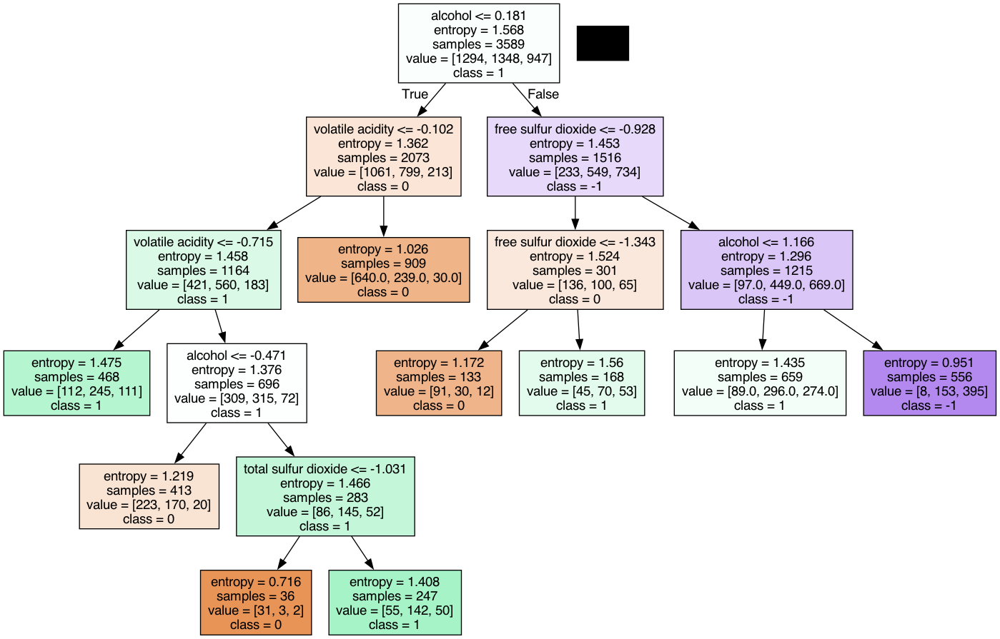

In [42]:
# Plot the decision tree
dot_data = tree.export_graphviz(dt_best,
                                feature_names = X_train.columns,
                                class_names   = [str(i) for i in set (Y_train)],
                                filled        = True,
                                out_file      = None)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())


## 6.8 Evaluating the result of new tree decision

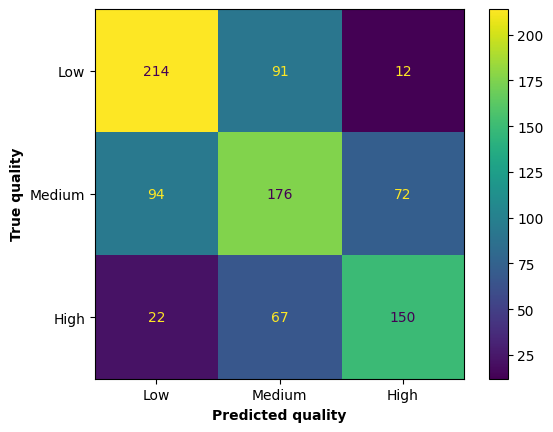

Evaluation of the model
Accuracy               : 60.13%
Cross validation score : 0.4963
F1 score               : 0.6006
Mean Squared Error     : 0.5122


In [43]:
#Additional library used
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error

# Calculate confusion matrix
DT_conf_matrix = confusion_matrix(Y_test, predictions)

# Plot confusion matrix
labels = ["Low", "Medium", "High"]
disp = ConfusionMatrixDisplay(confusion_matrix=DT_conf_matrix, display_labels=labels)
disp.plot()
plt.xlabel('Predicted quality',fontweight='bold')
plt.ylabel('True quality',fontweight='bold')
plt.show()


#Calculating the Accuracy
DT_accuracy = accuracy_score(Y_test, predictions)

# Calculating the Cross Validation Scores
x_data = wine.drop(["quality"], axis=1)
y_data = wine["quality"]
DT_cross_val = cross_val_score(dt_best, x_data, y_data, cv=5).mean()

# Calculating F1 Score
DT_F1 = f1_score(Y_test, predictions, average='weighted')

# Calculating Mean Squared Error
DT_mse = mean_squared_error(Y_test, predictions)


#Printing out the result
print(f"\033[1mEvaluation of the model\033[0m")
print(f"Accuracy               : {DT_accuracy*100:.4}%")
print(f"Cross validation score : {DT_cross_val:.4}")
print(f"F1 score               : {DT_F1:.4}")
print(f"Mean Squared Error     : {DT_mse:.4}")

## 6.9 Using Random Forest

Based on our results in using the Decision Tree algorithm, we have concluded that while decision trees are easily interpretable, it is prone to overfitting. Attempts to reducing overfitting causes the accuracy of subsequent tests to reduce, and thereby may not be a good algorithm in predicting wine qualities.

In this section, we explore the use of **random forest**, which is a supervised learning algorithm that builds an emsemble of decision trees, to predict wine qualities

### 6.9.1 Determine the accuracry of Random Forest

In [44]:
#Additional library used
from sklearn.ensemble import RandomForestClassifier
#from sklearn.ensemble import RandomForestRegressor


rf_model = RandomForestClassifier(n_estimators=100, random_state=0)
rf_model.fit(X_train, Y_train)
prediction = rf_model.predict(X_test)

print(f"Random Forest's accuracy: {rf_model.score(X_test, Y_test)*100:.2f}%")

Random Forest's accuracy: 66.93%


### 6.9.2 Rank the importances of each feature

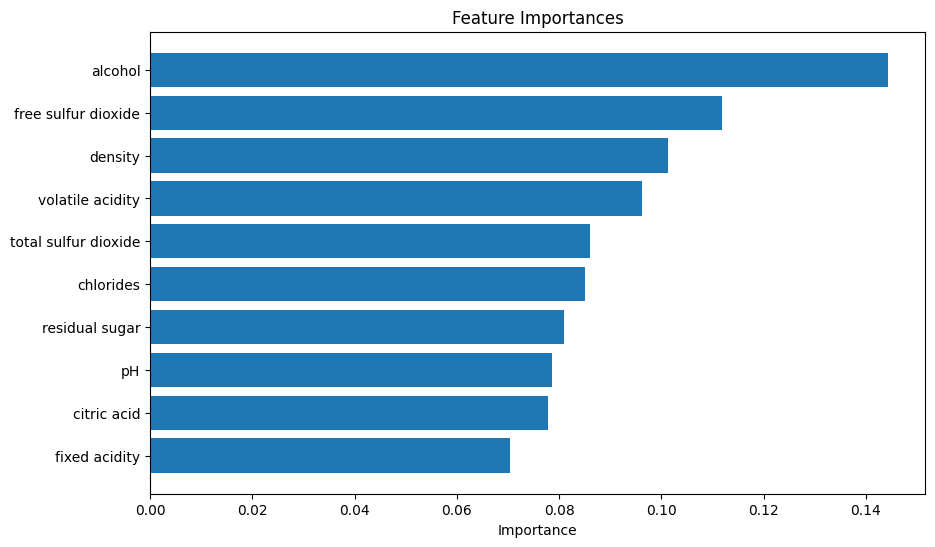

In [45]:
# Feature importance
feature_importance = rf_model.feature_importances_
feature_importance_dict = dict(zip(X_train.columns, feature_importance))
sorted_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_importance[:10])
plt.figure(figsize=(10, 6))
plt.barh(range(len(features)), importances, align='center')
plt.yticks(range(len(features)), features)
plt.xlabel('Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis() 
plt.show()

### 6.9.3 Visualise the current parameter used for Random Forest

In [46]:
# Finetune using RandomSearchCV
rf_estimator = RandomForestClassifier(random_state=0)

rf_params_df = pd.DataFrame([rf_estimator.get_params()])

#Visualise the paraments used
rf_params_df = rf_params_df.transpose()
rf_params_df.columns = ['Value']
rf_params_df

,Value
bootstrap,True
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,sqrt
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1


### 6.9.4 List of possible parameter be used for Random Forest

In [47]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['sqrt', 'log2']
max_features.append(None)

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(2, 14, num = 7)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Method of measuring the quality of a split.
criterion = ['gini', 'entropy']

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'criterion': criterion,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features,
               'bootstrap': bootstrap}

# Visualisation
rf_random_grid_df = pd.DataFrame.from_dict(random_grid, orient='index')
rf_random_grid_df

,0,1,2,3,4,5,6,7,8,9
n_estimators,200,400,600.0,800.0,1000.0,1200.0,1400.0,1600.0,1800.0,2000.0
criterion,gini,entropy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max_depth,2,4,6.0,8.0,10.0,12.0,14.0,NaN,NaN,NaN
min_samples_split,2,5,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min_samples_leaf,1,2,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max_features,sqrt,log2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bootstrap,True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 6.9.5 Best parameter be used for Random Forest

In [48]:
#First create the base model to tune
rf = RandomForestClassifier(random_state=0)

#Random search of parameters, using 3 fold cross validation, search across 10 different combinations, and use all available cores
rf_random = RandomizedSearchCV(
    estimator = rf, 
    param_distributions = random_grid, 
    n_iter = 10, 
    cv = 3, 
    verbose=2, 
    random_state=0, 
    n_jobs = -1
)


#Fit the random search model
rf_random.fit(X_train,Y_train)

#Visualise the result
rf_best_params = rf_random.best_params_
print(f"\n\n\033[1mBest Parameters Found:\033[0m")
rf_best_grid_df = pd.DataFrame(rf_best_params.items(), columns=['Parameter', 'Best Value'])
rf_best_grid_df


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   4.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   4.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   4.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   5.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   5.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   9.8s
[CV] END

,Parameter,Best Value
0,n_estimators,400
1,min_samples_split,2
2,min_samples_leaf,4
3,max_features,sqrt
4,max_depth,12
5,criterion,entropy
6,bootstrap,False


### 6.9.6 Reimplementing Random forest with adjusted parameter to prevent overfitting

In [49]:
rf_best = RandomForestClassifier(
    criterion='entropy', 
    n_estimators=400, 
    min_samples_split=2, 
    min_samples_leaf=4, 
    max_features='sqrt', 
    max_depth=5, 
    random_state=0, 
    bootstrap=True)

rf_best.fit(X_train, Y_train)

# Decision Tree Model Testing Accuracy
print(f"\033[1mModel Testing Accuracy: {rf_best.score(X_test, Y_test)*100:.2f}%\033[0m") 
print("(the higher the better)\n")

# Decision Tree Model Training Accuracy
print(f"\033[1mModel Training Accuracy: {rf_best.score(X_train, Y_train)*100:.2f}%\033[0m") 
print("(too high will not be better, is better if testing > training)")


Model Testing Accuracy: 62.36%
(the higher the better)

Model Training Accuracy: 66.59%
(too high will not be better, is better if testing > training)


### 6.9.7 Visiualise the new Random Forest

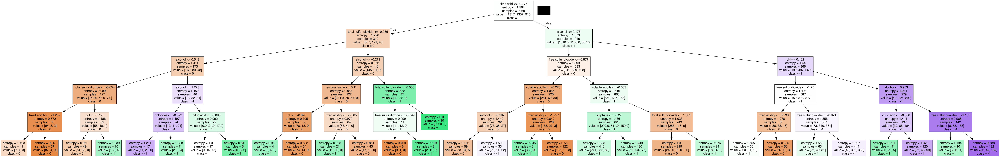

In [50]:
# Plot the decision tree
dot_data = tree.export_graphviz(rf_best.estimators_[0],
                                feature_names = X_train.columns,
                                class_names   = [str(i) for i in set (Y_train)],
                                filled        = True,
                                out_file      = None)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

### 6.9.8 Evaluating the result of new random forest

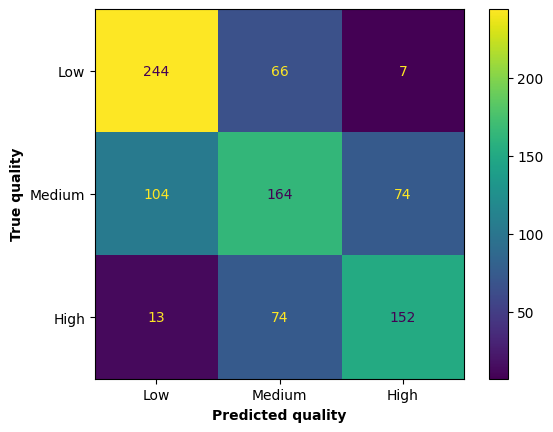

Evaluation of the model
Accuracy               : 62.36%
Cross validation score : 0.5332
F1 score               : 0.6189
Mean Squared Error     : 0.4432


In [51]:
predictions = rf_best.predict(X_test)

# Calculate confusion matrix
RF_conf_matrix = confusion_matrix(Y_test, predictions)

# Plot confusion matrix
labels = ["Low", "Medium", "High"]
disp = ConfusionMatrixDisplay(confusion_matrix=RF_conf_matrix, display_labels=labels)
disp.plot()
plt.xlabel('Predicted quality',fontweight='bold')
plt.ylabel('True quality',fontweight='bold')
plt.show()


#Calculating the Accuracy
RF_accuracy = accuracy_score(Y_test, predictions)

# Calculating the Cross Validation Scores
x_data = wine.drop(["quality"], axis=1)
y_data = wine["quality"]
RF_cross_val = cross_val_score(rf_best, x_data, y_data, cv=5).mean()

# Calculating F1 Score
RF_F1 = f1_score(Y_test, predictions, average='weighted')

# Calculating Mean Squared Error
RF_mse = mean_squared_error(Y_test, predictions)


#Printing out the result
print(f"\033[1mEvaluation of the model\033[0m")
print(f"Accuracy               : {RF_accuracy*100:.4}%")
print(f"Cross validation score : {RF_cross_val:.4}")
print(f"F1 score               : {RF_F1:.4}")
print(f"Mean Squared Error     : {RF_mse:.4}")

# 7. Fully Connected Neural Network

## 7.1 Loading Training and Test Data

In [71]:
nn_wine = final_wine.copy()

# Split data into features and labels
X = nn_wine.drop(columns=["quality"])
y = nn_wine["quality"]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

nn_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000,4487.000000
mean,0.021202,-0.005020,-0.050103,-0.084051,-0.116157,-0.101539,-0.099689,-0.090218,0.016409,-0.055233,0.082496,-0.094718
std,0.952197,0.912955,0.874474,0.905867,0.599243,0.917311,0.936881,0.909810,0.962731,0.959459,0.993093,0.783914
min,-3.391226,-1.938986,-2.730789,-1.093352,-1.467765,-1.911289,-2.740807,-2.299932,-2.675825,-2.381769,-2.127792,-1.000000
25%,-0.622262,-0.604751,-0.525459,-0.887634,-0.472085,-0.749029,-0.785833,-0.815890,-0.629977,-0.795984,-0.730825,-1.000000
50%,-0.045395,-0.101889,-0.117064,-0.332197,-0.169052,-0.187715,-0.213190,-0.195194,-0.036022,-0.179290,-0.061045,0.000000
75%,0.531472,0.433339,0.373009,0.470102,0.133981,0.471345,0.552052,0.551038,0.623929,0.525503,0.830490,1.000000
max,8.492243,4.829267,10.827909,3.309005,6.021478,5.091330,3.126048,2.517181,4.121669,5.194758,2.967027,1.000000


## 7.2 Multi-Class Classification with Neural Networks using Keras and Hyperparameter Tuning

Introduction
-
This code demonstrates multi-class classification using neural networks with Keras and hyperparameter tuning using the Keras Tuner library. The dataset has features and corresponding labels, where each label can be "Low", "Medium", or "High".

Libraries
-
- `numpy`: For numerical operations.
- `tensorflow` and `keras`: For building and training neural networks.
- `sklearn.metrics`: For evaluating model performance.
- `kerastuner.tuners.RandomSearch`: For hyperparameter tuning.

Custom Callback
-
A callback is defined to monitor weights and biases during training.

One-Hot Encoding and Categorical Crossentropy Loss
-
The target variable is converted to one-hot encoded format. Since there are only 3 classes, using categorical crossentropy loss is suitable for this classification problem.

Hypermodel Builder Function
-
Defines a function to construct a neural network model with sampled hyperparameters.

Tuner Instantiation
-
Initializes a random search tuner with the hypermodel and search parameters.

Hyperparameter Search
-
Performs hyperparameter search using the tuner.

Evaluate the Best Model
-
Evaluates the best model selected by the tuner on the test set.

Confusion Matrix
-
Calculates and displays the confusion matrix with class labels "Low", "Medium", and "High".


Trial 20 Complete [00h 00m 33s]
val_loss: 0.7982096672058105

Best val_loss So Far: 0.7291203141212463
Total elapsed time: 00h 07m 41s


/Users/yehudanathan/Documents/NTU/Y4S2/SC5010/Project/.venv/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6006 - loss: 0.7985 - mse: 0.1626  
Test Loss: 0.748441219329834
Test Accuracy: 0.6302895545959473
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Class Labels: ['Low', 'Medium', 'High']
Confusion Matrix:
 [[ 95  15  41]
 [ 49  81   4]
 [ 54   3 107]]


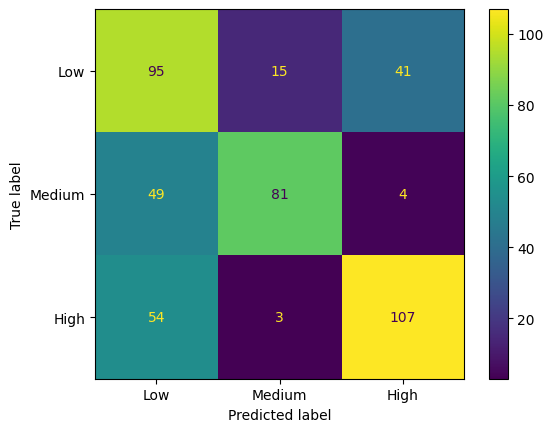

In [72]:
#Additional library used
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers
from kerastuner.tuners import RandomSearch

# Define the callback to print initialized weights and gradients
class WeightMonitorCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train):
        self.X_train = X_train
        self.y_train = y_train

    def on_train_begin(self, logs=None):
        for layer in self.model.layers:
            print(f"Layer: {layer.name}")
            if layer.weights:
                print(f"Initialized Weights (First 10 numbers): {layer.weights[0].numpy()[:10]}")
                print(f"Initialized Biases (First 10 numbers): {layer.weights[1].numpy()[:10]}")
            else:
                print("No weights initialized for this layer.")

    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch: {epoch + 1}")
        for layer in self.model.layers:
            print(f"Layer: {layer.name}")
            if layer.weights:
                print(f"All Weights (First 10 numbers): {layer.weights[0].numpy()[:10]}")
                print(f"All Biases (First 10 numbers): {layer.weights[1].numpy()[:10]}")
            else:
                print("No weights initialized for this layer.")

# Perform one-hot encoding for the target variable
num_classes = 3
y_train_one_hot = tf.keras.utils.to_categorical(y_train, num_classes=num_classes)
y_test_one_hot = tf.keras.utils.to_categorical(y_test, num_classes=num_classes)

# Define the hypermodel builder function
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape=(X_train.shape[1],)))
    for i in range(hp.Int("num_layers", 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f"units_{i}", min_value=32, max_value=512, step=32),
            kernel_initializer=initializers.GlorotUniform(),
            bias_initializer=initializers.Zeros()
        ))
        model.add(layers.BatchNormalization())  # Add batch normalization after each dense layer
        activation = hp.Choice(f"activation_{i}", ["relu", "sigmoid", "tanh"])  # Choose activation function
        model.add(layers.Activation(activation))  # Add activation function
    model.add(layers.Dense(num_classes, activation="softmax"))  # Output layer with num_classes units for classification

    # Compile model with custom loss
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=hp.Float("lr", min_value=1e-5, max_value=1e-2, sampling="log")),
        loss="categorical_crossentropy",  # Use categorical crossentropy as loss function
        metrics=["accuracy", "mse"]
    )
    return model

# Instantiate the tuner
tuner = RandomSearch(
    hypermodel=build_model,
    objective="val_loss",  # Use "val_loss" as the objective for hyperparameter search
    max_trials=20,
    executions_per_trial=2,  # Execute each model twice
    overwrite=True,
    directory="results",
    project_name="tuner_result2",
)

# Perform hyperparameter search
tuner.search(X_train, y_train_one_hot, epochs=20, validation_split=0.2, callbacks=[WeightMonitorCallback(X_train, y_train_one_hot)])

# Get the top model
models = tuner.get_best_models(num_models=1)
best_model = models[0]

# Evaluate the best model on the test set
test_loss, test_accuracy, test_mse = best_model.evaluate(X_test, y_test_one_hot)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Calculate confusion matrix for the test set
y_pred = best_model.predict(X_test)
conf_matrix = confusion_matrix(np.argmax(y_test_one_hot, axis=1), np.argmax(y_pred, axis=1))

# Display confusion matrix with specified class labels
class_labels = ["Low", "Medium", "High"]
print("Class Labels:", class_labels)
print("Confusion Matrix:\n", conf_matrix)
conf_matrix_display = ConfusionMatrixDisplay(conf_matrix, display_labels=class_labels)
conf_matrix_display.plot()

## 7.3 Best Model Summary

In [73]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 160)            │         1,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 160)            │           640 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 160)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 448)            │        72,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 448)            │         1,792 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 96)             │        43,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 96)             │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           291 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,259 (469.76 KB)

 Trainable params: 118,851 (464.26 KB)

 Non-trainable params: 1,408 (5.50 KB)

## 7.4 Best Hyperparameter Combinations

In [74]:
tuner.results_summary()

Results summary
Results in results/tuner_result2
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 15 summary
Hyperparameters:
num_layers: 3
units_0: 160
activation_0: relu
lr: 0.0014106444133753096
units_1: 448
activation_1: sigmoid
units_2: 96
activation_2: tanh
Score: 0.7291203141212463

Trial 04 summary
Hyperparameters:
num_layers: 3
units_0: 416
activation_0: relu
lr: 0.00018605746482849058
units_1: 192
activation_1: sigmoid
units_2: 480
activation_2: sigmoid
Score: 0.7353901267051697

Trial 11 summary
Hyperparameters:
num_layers: 3
units_0: 96
activation_0: tanh
lr: 0.00016286311502669432
units_1: 128
activation_1: relu
units_2: 448
activation_2: relu
Score: 0.736556887626648

Trial 13 summary
Hyperparameters:
num_layers: 3
units_0: 224
activation_0: sigmoid
lr: 0.0025388244251763783
units_1: 128
activation_1: relu
units_2: 64
activation_2: sigmoid
Score: 0.738189309835434

Trial 03 summary
Hyperparameters:
num_layers: 1
units_0: 384
activation_0: relu
lr:

## 7.5 Building the Actual Model, Finding the Best Epoch, and Test it on the Test set

The following code use the best hyperparameters at the time of running which might change. However, the loss and metric evaluated on test set doesnt change much

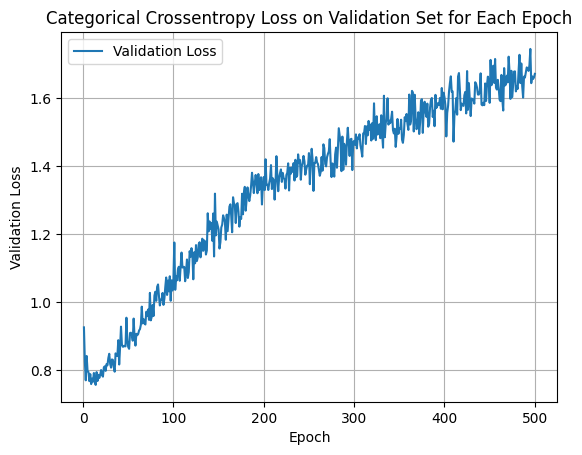

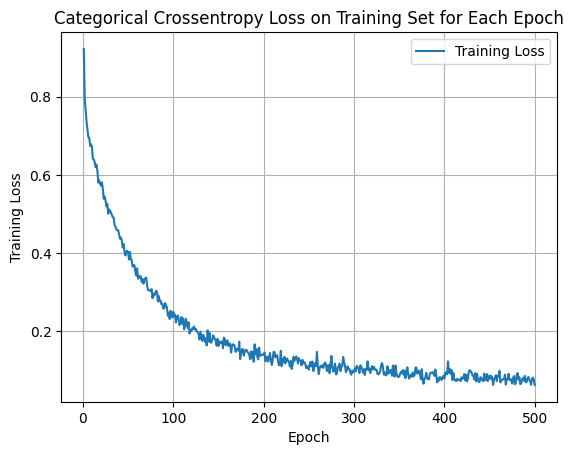

The best epoch to minimize validation loss: 14
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


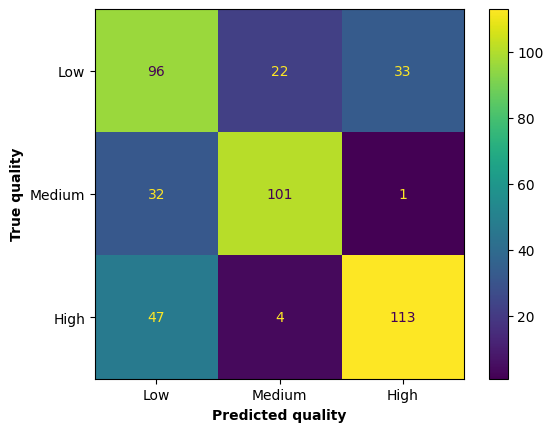

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - accuracy: 0.6933 - loss: 0.7423 - mse: 0.1464
Evaluation of the model on the testing set
Accuracy          : 69.04%
Mean Squared Error: 0.1465
Test Loss         : 0.7345


In [75]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, initializers
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Perform one-hot encoding for the target variable
y_train_one_hot = tf.keras.utils.to_categorical(y_train, num_classes=3)
y_test_one_hot = tf.keras.utils.to_categorical(y_test, num_classes=3)

# Define the hyperparameters
hyperparameters = {
    "num_layers": 3,
    "units_0": 192,
    "activation_0": "relu",
    "lr": 0.0004654410099384616,
    "units_1": 64,
    "activation_1": "relu",
    "units_2": 480,
    "activation_2": "tanh"
}

# Define the hypermodel builder function
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape=(X_train.shape[1],)))
    for i in range(hyperparameters["num_layers"]):
        model.add(layers.Dense(
            units=hyperparameters[f"units_{i}"],
            kernel_initializer=initializers.GlorotUniform(),
            bias_initializer=initializers.Zeros()
        ))
        model.add(layers.BatchNormalization())  # Add batch normalization after each dense layer
        model.add(layers.Activation(hyperparameters[f"activation_{i}"]))  # Add activation function
    model.add(layers.Dense(3, activation="softmax"))  # Output layer with 3 units for classification

    # Compile model with custom loss
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=hyperparameters["lr"]),
        loss="categorical_crossentropy",  # Use categorical crossentropy as loss function
        metrics=["accuracy", "mse"]
    )
    return model

# Build the model
best_model = build_model(hyperparameters)

# Train the model to find the best epoch
history = best_model.fit(X_train, y_train_one_hot, epochs=500, validation_split=0.2, verbose=0)

# Record the validation loss for each epoch
val_loss = history.history['val_loss']
train_loss = history.history['loss']

# Plot the categorical crossentropy loss on the validation set for each epoch
plt.plot(range(1, 501), val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.title('Categorical Crossentropy Loss on Validation Set for Each Epoch')
plt.legend()
plt.grid(True)
plt.show()

# Plot the categorical crossentropy loss on the training set for each epoch
plt.plot(range(1, 501), train_loss, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.title('Categorical Crossentropy Loss on Training Set for Each Epoch')
plt.legend()
plt.grid(True)
plt.show()

# Find the best epoch to minimize validation loss
best_epoch = np.argmin(val_loss) + 1

# Print the best epoch
print("The best epoch to minimize validation loss:", best_epoch)

# Train the model again using the best epoch
best_model = build_model(hyperparameters)
best_model.fit(X_train, y_train_one_hot, epochs=best_epoch, verbose=0)

# Calculate confusion matrix for the test set
y_pred = best_model.predict(X_test)
NN_conf_matrix = confusion_matrix(np.argmax(y_test_one_hot, axis=1), np.argmax(y_pred, axis=1))

# Define the class labels
class_labels = ["Low", "Medium", "High"]

# Display confusion matrix with specified class labels
conf_matrix_display = ConfusionMatrixDisplay(NN_conf_matrix, display_labels=class_labels)
conf_matrix_display.plot()
plt.xlabel('Predicted quality', fontweight='bold')
plt.ylabel('True quality', fontweight='bold')
plt.show()

# Evaluate the model on the test set
CCE_test_loss, CCE_test_accuracy, CCE_test_mse = best_model.evaluate(X_test, y_test_one_hot)
print("\033[1mEvaluation of the model on the testing set\033[0m")
print(f"Accuracy          : {CCE_test_accuracy*100:.4}%")
print(f"Mean Squared Error: {CCE_test_mse:.4}")
print(f"Test Loss         : {CCE_test_loss:.4}")


#### Conclusion: It turns out that 4-layer NN with 192, 64, 480, 3 neurons in each layer with lr=4.65e-4 gives the best performance

# 8. Result Analysis and Conclusion

Linear Regreesion's Final Result Evaluation:



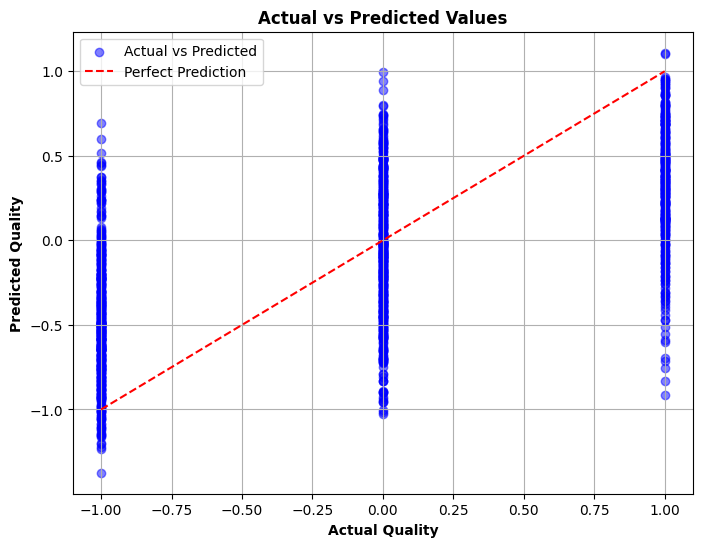


Evaluation of the model on overall dataset
Mean Absolute Error            : 0.504
Mean Squared score             : 0.3727
Root Mean Squared Error (RMSE) : 0.6105
R-squared (R2) Score           : 39.49%
Cross-validated MSE            : -0.3941


k-Means Clustering's Final Result Evaluation:



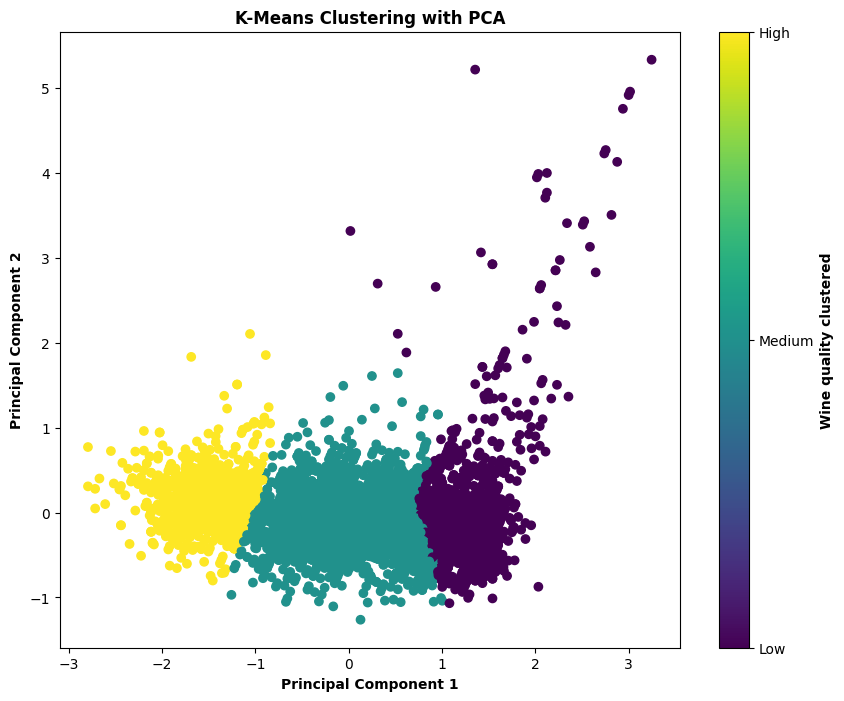


Overall purity                     : 56.2645%
 Purity for Low quality wine   : 62.2483%
 Purity for Medium quality wine: 43.2120%
 Purity for High quality wine  : 63.3333%

Mean of Squared Errors (MSE)       : 0.2009
Averaged distance between centroids: 2.0047
Silhouette Score                   : 0.4024




Decision Tree Classifier's Final Result Evaluation:



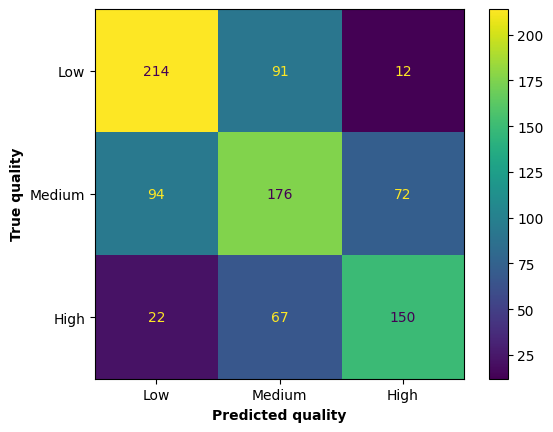

Accuracy               : 60.13%
Cross validation score : 0.4963
F1 score               : 0.6006
Mean Squared Error     : 0.5122


Random Forest Classifier's Final Result Evaluation:



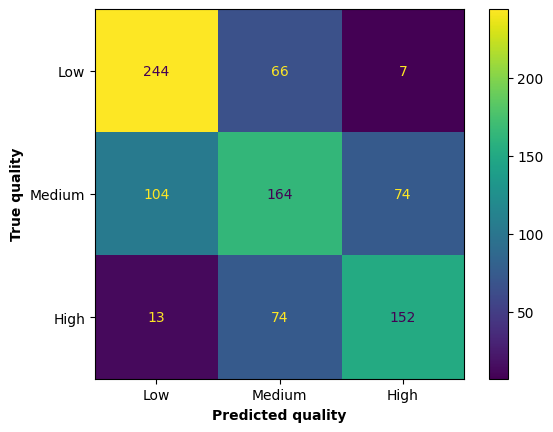

Accuracy               : 62.36%
Cross validation score : 0.5332
F1 score               : 0.6189
Mean Squared Error     : 0.4432


Neural Network's Final Result Evaluation:



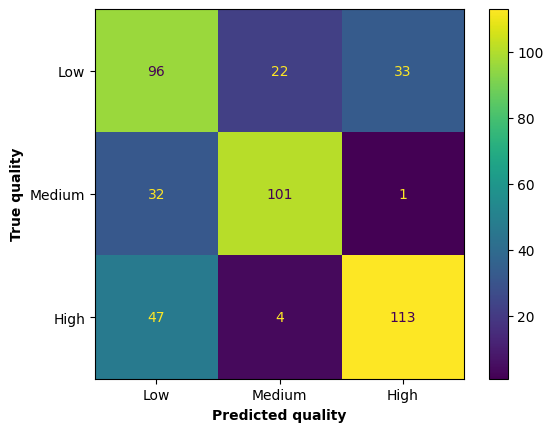

Accuracy          : 69.04%
Mean Squared Error: 0.1465
Test Loss         : 0.7345


In [77]:
#Linear Regression Result
print(f"\033[1mLinear Regreesion's Final Result Evaluation:\033[0m\n")

plt.figure(figsize=(8, 6))
plt.scatter(LR_y_test, LR_y_test_pred, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot([min(LR_y_test), max(LR_y_test)], [min(LR_y_test), max(LR_y_test)], color='red', linestyle='--', label='Perfect Prediction')
plt.title('Actual vs Predicted Values',fontweight='bold')
plt.xlabel('Actual Quality',fontweight='bold')
plt.ylabel('Predicted Quality',fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

print(f"\n\033[1mEvaluation of the model on overall dataset\033[0m")
print(f"Mean Absolute Error            : {LR_mae:.4}")
print(f"Mean Squared score             : {LR_mse:.4}")
print(f"Root Mean Squared Error (RMSE) : {LR_rmse:.4}")
print(f"R-squared (R2) Score           : {LR_r2*100:.4}%")
print(f"Cross-validated MSE            : {LR_cv_score.mean():.4f}")


#k-Means Result
print(f"\n\n\033[1mk-Means Clustering's Final Result Evaluation:\033[0m\n")

#Parameter selected
features = ['alcohol', 'chlorides']

pca = PCA(n_components=2)
principal_components = pca.fit_transform(kmeans_wine[features])
unique_labels = sorted(kmeans_wine['cluster_label'].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
plt.figure(figsize=(10, 8))
scatter = plt.scatter(principal_components[:, 0], principal_components[:, 1],
                      c=kmeans_wine['cluster_label'], cmap=plt.get_cmap('viridis'))
colorbar = plt.colorbar(scatter, ticks=np.arange(min(unique_labels), max(unique_labels)+1))
colorbar.set_label('Wine quality clustered',fontweight='bold')
colorbar.set_ticklabels(['Low', 'Medium', 'High'])
plt.xlabel('Principal Component 1',fontweight='bold')
plt.ylabel('Principal Component 2',fontweight='bold')
plt.title('K-Means Clustering with PCA',fontweight='bold')
plt.show()

print(f"\n\033[1mOverall purity                     : {km_overall_purity:.4f}%\033[0m") 
print(f" Purity for Low quality wine   : {quality_purity['Low   ']:.4f}%") 
print(f" Purity for Medium quality wine: {quality_purity['Medium']:.4f}%") 
print(f" Purity for High quality wine  : {quality_purity['High  ']:.4f}%") 

print(f"\n\033[1mMean of Squared Errors (MSE)       : {km_mse:.4f}")
print(f"\033[1mAveraged distance between centroids: {km_ad:.4f}\033[0m")
print(f"\033[1mSilhouette Score                   : {km_ss:.4f}\033[0m\n\n")


#Decision Tree Result
print(f"\n\n\033[1mDecision Tree Classifier's Final Result Evaluation:\033[0m\n")

labels = ["Low", "Medium", "High"]
disp = ConfusionMatrixDisplay(confusion_matrix=DT_conf_matrix, display_labels=labels)
disp.plot()
plt.xlabel('Predicted quality',fontweight='bold')
plt.ylabel('True quality',fontweight='bold')
plt.show()

print(f"Accuracy               : {DT_accuracy*100:.4}%")
print(f"Cross validation score : {DT_cross_val:.4}")
print(f"F1 score               : {DT_F1:.4}")
print(f"Mean Squared Error     : {DT_mse:.4}")


#Random Forest Result
print(f"\n\n\033[1mRandom Forest Classifier's Final Result Evaluation:\033[0m\n")

labels = ["Low", "Medium", "High"]
disp = ConfusionMatrixDisplay(confusion_matrix=RF_conf_matrix, display_labels=labels)
disp.plot()
plt.xlabel('Predicted quality',fontweight='bold')
plt.ylabel('True quality',fontweight='bold')
plt.show()

print(f"Accuracy               : {RF_accuracy*100:.4}%")
print(f"Cross validation score : {RF_cross_val:.4}")
print(f"F1 score               : {RF_F1:.4}")
print(f"Mean Squared Error     : {RF_mse:.4}")

#Neural Network Result
print(f"\n\n\033[1mNeural Network's Final Result Evaluation:\033[0m\n")

conf_matrix_display = ConfusionMatrixDisplay(NN_conf_matrix, display_labels=class_labels)
conf_matrix_display.plot()
plt.xlabel('Predicted quality',fontweight='bold')
plt.ylabel('True quality',fontweight='bold')
plt.show()

print(f"Accuracy          : {CCE_test_accuracy*100:.4}%")
print(f"Mean Squared Error: {CCE_test_mse:.4}")
print(f"Test Loss         : {CCE_test_loss:.4}")

***Result Analysis:***

- Lowest predictive accuracy: Linear Regression (39.49% accuracy with 0.3727 MSE)- Highest predictive accuracy: Neural Network (69.04% accuracy with 0.1465 MSE)
